## Import Libraries

In [466]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

In [467]:
df = pd.read_csv('data/final_v3.csv')
df['date_fin'] = pd.to_datetime(df['date_fin'])
df.head()

,TICKER,date_fin,gvkey,permnofin,CAPEI,bm,evm,pe_op_basic,pe_op_dil,pe_exi,...,us_inst_valuation,us_ind_valuation,cshoc,cshtrd,prccd,market_value,xi_nominal,xi_real,wpc,spc
0,AAPL,2010-01-31,1690,14593,43.783,0.203,13.424,20.831,21.152,21.152,...,64.65,66.95,9.060901e+08,2.837278e+07,207.715737,1.882072e+11,3290.902098,1501.467844,1661.0,37.0
1,AAPL,2010-02-28,1690,14593,48.834,0.202,10.239,0.701,0.714,0.714,...,66.67,64.94,9.067950e+08,2.019496e+07,198.795000,1.802663e+11,3146.213446,1435.453871,3524.0,33.0
2,AAPL,2010-03-31,1690,14593,56.260,0.202,10.239,0.805,0.820,0.820,...,65.70,63.35,9.067950e+08,1.880575e+07,223.410648,2.025877e+11,4466.365840,2037.770799,984.0,40.0
3,AAPL,2010-04-30,1690,14593,62.527,0.202,10.239,0.894,0.911,0.911,...,62.11,62.38,9.078427e+08,2.094627e+07,251.148548,2.280187e+11,4213.516131,1922.408658,984.0,47.0
4,AAPL,2010-05-31,1690,14593,54.324,0.199,11.041,0.765,0.779,0.779,...,60.74,65.43,9.099380e+08,3.221138e+07,251.461200,2.288141e+11,4046.137234,1846.042431,886.0,43.0


In [468]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 52 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   TICKER             3600 non-null   object        
 1   date_fin           3600 non-null   datetime64[ns]
 2   gvkey              3600 non-null   int64         
 3   permnofin          3600 non-null   int64         
 4   CAPEI              3600 non-null   float64       
 5   bm                 3600 non-null   float64       
 6   evm                3600 non-null   float64       
 7   pe_op_basic        3600 non-null   float64       
 8   pe_op_dil          3600 non-null   float64       
 9   pe_exi             3600 non-null   float64       
 10  pe_inc             3600 non-null   float64       
 11  ps                 3600 non-null   float64       
 12  pcf                3600 non-null   float64       
 13  dpr                3600 non-null   float64       
 14  npm     

In [746]:
df.sector.value_counts()/120

sector
Technology                20.0
Healthcare                 8.0
Communication Services     2.0
Name: count, dtype: float64

In [470]:
# Convert Market Value to Billions
df['market_value'] = df['market_value']/1000000000

## YFinance

In [471]:
import yfinance as yf    
from datetime import datetime

price_data = []
for ticker in df.TICKER.unique():
    price = yf.download(ticker, start= datetime(2010,1,1), end = datetime(2020,1,1),interval='1mo')
    price['TICKER'] = ticker
    price_data.append(price)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [472]:
price_data_df = pd.concat(price_data)
price_data_df.reset_index(inplace=True)
price_data_df['year'] = price_data_df['Date'].dt.year
price_data_df['month'] = price_data_df['Date'].dt.month

df['year'] = df['date_fin'].dt.year
df['month'] = df['date_fin'].dt.month

/var/folders/z1/2gclrh7s5_56l2ndhf0qrc4m0000gn/T/ipykernel_73710/3195484828.py:1: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  price_data_df = pd.concat(price_data)


In [473]:
selected = price_data_df[['Adj Close', 'TICKER', 'year', 'month']]
merged_df = pd.merge(df, selected, on=['TICKER', 'month', 'year'], how='left')
merged_df.loc[merged_df['TICKER'] == 'SGEN', 'Adj Close'] = df.loc[df['TICKER'] == 'SGEN', 'prccd'].values
merged_df.drop('prccd', axis=1, inplace=True)
merged_df.rename({'Adj Close': 'close_price'}, axis=1, inplace=True)

In [474]:
df = merged_df.copy()

## Exploratory Data Analysis

#### Average Volume

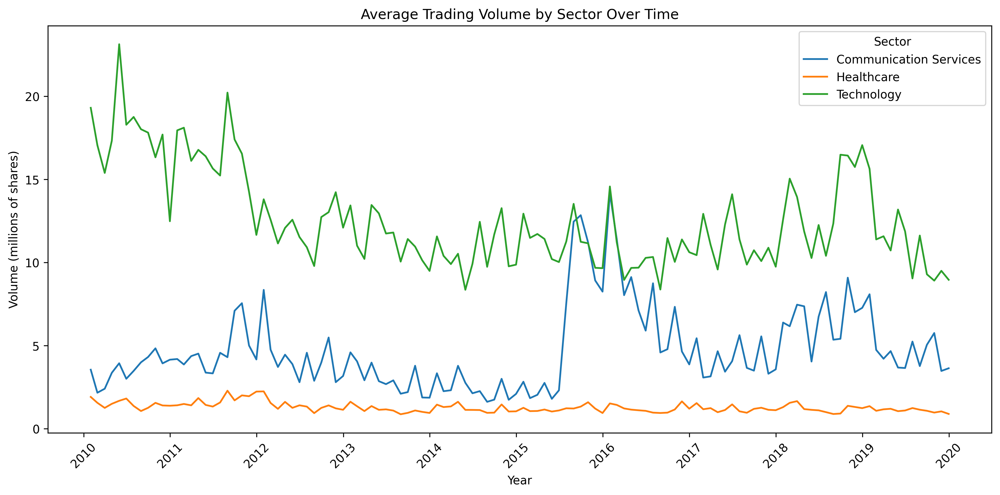

<Figure size 640x480 with 0 Axes>

In [672]:
# Group by sector and date, then calculate average volume
sector_vol_over_time = df.groupby(['sector', 'date_fin'])['cshtrd'].mean().unstack()

# Convert date_fin to datetime
sector_vol_over_time.columns = pd.to_datetime(sector_vol_over_time.columns)

# Create a line plot
plt.figure(figsize=(12, 6), dpi=300)
for sector in sector_vol_over_time.index:
    plt.plot(sector_vol_over_time.columns, sector_vol_over_time.loc[sector]/1000000, label=sector)

# Customize the plot
plt.title('Average Trading Volume by Sector Over Time')
plt.xlabel('Year')
plt.ylabel('Volume (millions of shares)')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

# Clear the current figure
plt.clf()



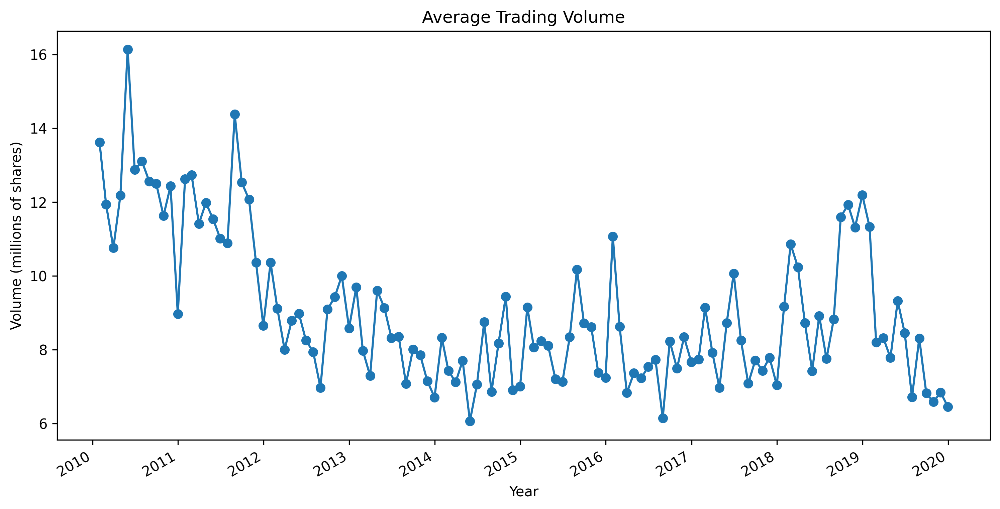

In [674]:
# Average shares traded
vol_avg=df.groupby('date_fin')['cshtrd'].mean().rename('volume')

# Convert date_fin to datetime
vol_avg.index = pd.to_datetime(vol_avg.index)

# Create a new figure
plt.figure(figsize=(12, 6), dpi=300)

# Plot the data
plt.plot(vol_avg.index, vol_avg.values/1000000, marker='o', linestyle='-')

# Set x-axis to show only years
years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
plt.gca().xaxis.set_major_locator(years)
plt.gca().xaxis.set_major_formatter(years_fmt)


# Other plot settings
plt.xlabel('Year')
plt.ylabel('Volume (millions of shares)')
plt.title('Average Trading Volume')
plt.grid(False)

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

# Show the plot
plt.show()

#### Average Return

In [477]:
# Calculate monthly returns for each ticker
df['date_fin'] = pd.to_datetime(df['date_fin'])
df = df.sort_values(['TICKER', 'date_fin'])

# Group by TICKER and calculate the percentage change in market_value
df['monthly_return'] = df.groupby('TICKER')['market_value'].pct_change()

# To remove rows with NaN monthly returns (first row for each TICKER)
# df = df.dropna(subset=['monthly_return'])

# Optional: If you want to fill NaN values with 0 (for the first row of each TICKER)
df['monthly_return'] = df['monthly_return'].fillna(0)

print(df[['TICKER', 'date_fin', 'market_value', 'monthly_return']].head(10))

  TICKER   date_fin  market_value  monthly_return
0   AAPL 2010-01-31    188.207205        0.000000
1   AAPL 2010-02-28    180.266312       -0.042192
2   AAPL 2010-03-31    202.587658        0.123824
3   AAPL 2010-04-30    228.018653        0.125531
4   AAPL 2010-05-31    228.814101        0.003489
5   AAPL 2010-06-30    237.626545        0.038514
6   AAPL 2010-07-31    232.302149       -0.022407
7   AAPL 2010-08-31    229.599601       -0.011634
8   AAPL 2010-09-30    250.180272        0.089637
9   AAPL 2010-10-31    275.278285        0.100320


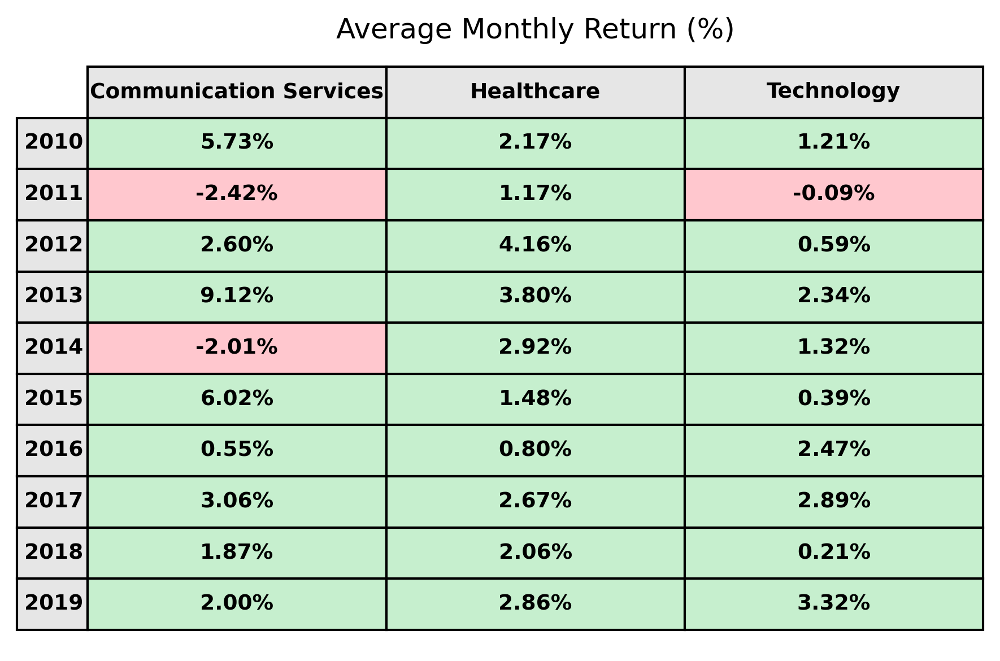

In [709]:
# Calculate average market return by sector and year
avg_returns = df.groupby([df['date_fin'].dt.year, 'sector'])['monthly_return'].mean().unstack()

# Convert to percentage and round to 2 decimal places
avg_returns = (avg_returns * 100).round(2)

# Create a matplotlib visualization of the table
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)  # Reduced width

# Hide axes
ax.axis('off')

# Create the table
table = ax.table(cellText=avg_returns.values,
                 rowLabels=avg_returns.index,
                 colLabels=avg_returns.columns,
                 cellLoc='center',
                 loc='center')

# Color cells based on values
for (row, col), cell in table.get_celld().items():
    if row == 0:  # Header
        cell.set_text_props(weight='bold', color='black')
        cell.set_facecolor('#E6E6E6')  # Light gray for header
    elif col == -1:  # Year column
        cell.set_text_props(weight='bold', color='black')
        cell.set_facecolor('#E6E6E6')  # Light gray for year column
    else:
        value = avg_returns.values[row-1, col]
        if pd.notnull(value):
            if value < 0:
                cell.set_facecolor('#FFC7CE')  # Light red for negative values
            else:
                cell.set_facecolor('#C6EFCE')  # Light green for positive values
            cell._text.set_text(f'{value:.2f}%')  # Add % symbol
            cell.set_text_props(weight='bold', color='black')  # Make text black and bold

# Adjust table style
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 1.6)  # Adjust the scale to make cells taller

# Add a title
plt.title("Average Monthly Return (%)", fontsize=12)

# Adjust layout and display
plt.tight_layout()
plt.show()


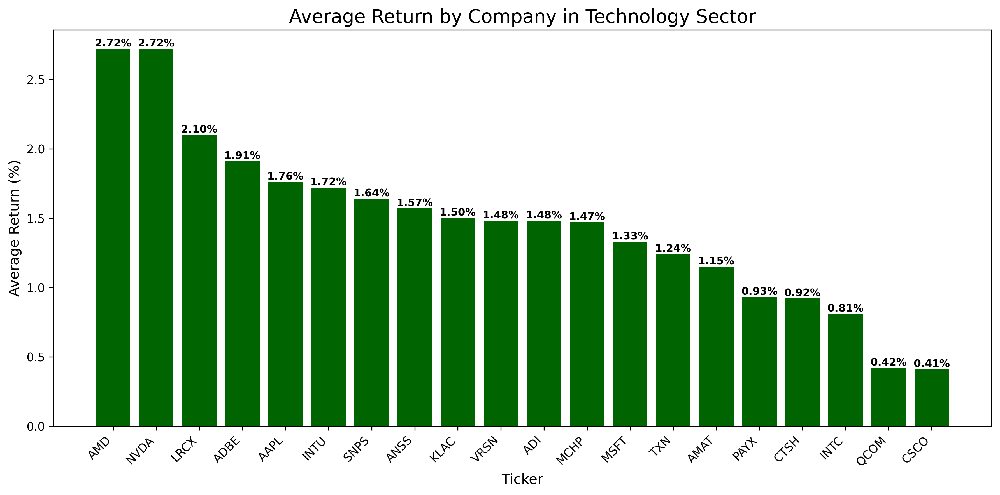

In [479]:
# Filter the dataframe for the Technology sector and calculate average returns
tech_returns = df[(df['sector'] == 'Technology') & (df['TICKER'].notna())].groupby('TICKER')['monthly_return'].mean().sort_values(ascending=False)

# Convert to percentage and round to 2 decimal places
tech_returns = (tech_returns * 100).round(2)

# Create color list based on values
colors = ['darkgreen' if x >= 0 else 'darkred' for x in tech_returns]

# Create a bar plot
plt.figure(figsize=(12, 6), dpi=300)
bars = plt.bar(tech_returns.index, tech_returns.values, color=colors)

# Customize the plot
plt.title('Average Return by Company in Technology Sector', fontsize=16)
plt.xlabel('Ticker', fontsize=12)
plt.ylabel('Average Return (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Add value labels inside the bars at the top
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height,
             f'{height:.2f}%',
             ha='center', va='bottom', fontweight='bold', color='black', 
             fontsize=plt.rcParams['font.size'] - 1)

# Show the plot
plt.show()


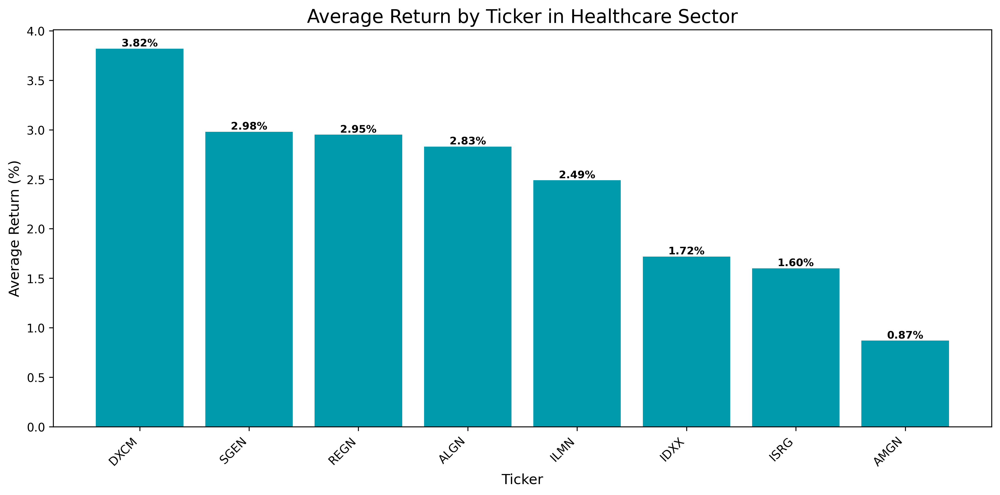

In [480]:
# Filter the dataframe for the Healthcare sector and calculate average returns
healthcare_returns = df[(df['sector'] == 'Healthcare') & (df['TICKER'].notna())].groupby('TICKER')['monthly_return'].mean().sort_values(ascending=False)

# Convert to percentage and round to 2 decimal places
healthcare_returns = (healthcare_returns * 100).round(2)

# Create color list based on values (now using dark blue for all bars)
colors = ['#009AAD' for _ in healthcare_returns]

# Create a bar plot
plt.figure(figsize=(12, 6), dpi=300)
bars = plt.bar(healthcare_returns.index, healthcare_returns.values, color=colors)

# Customize the plot
plt.title('Average Return by Ticker in Healthcare Sector', fontsize=16)
plt.xlabel('Ticker', fontsize=12)
plt.ylabel('Average Return (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Add value labels inside the bars at the top
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height,
             f'{height:.2f}%',
             ha='center', va='bottom', fontweight='bold', color='black', 
             fontsize=plt.rcParams['font.size'] - 1)

# Show the plot
plt.show()

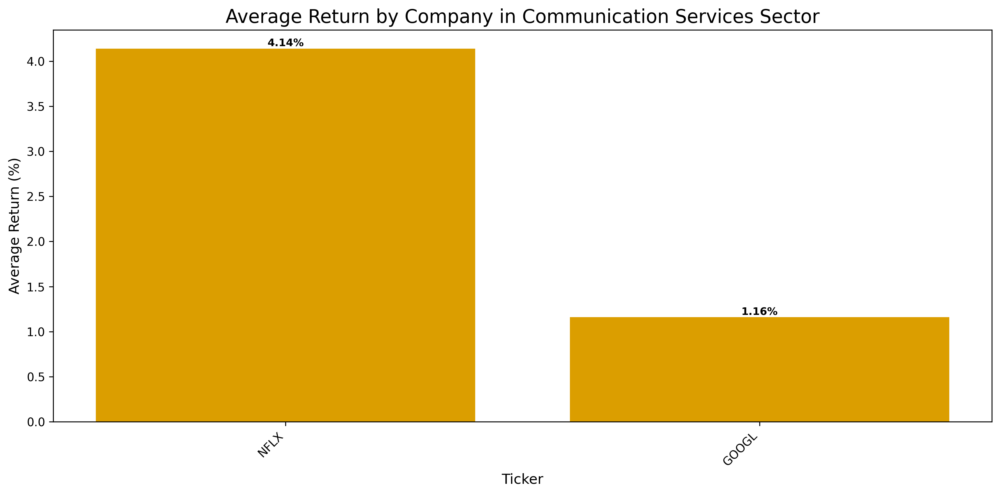

In [481]:
# Filter the dataframe for the Communication Services sector and calculate average returns
comm_services_returns = df[(df['sector'] == 'Communication Services') & (df['TICKER'].notna())].groupby('TICKER')['monthly_return'].mean().sort_values(ascending=False)

# Convert to percentage and round to 2 decimal places
comm_services_returns = (comm_services_returns * 100).round(2)

# Create color list based on values (now using dark blue for all bars)
colors = ['#DB9E00' for _ in comm_services_returns]

# Create a bar plot
plt.figure(figsize=(12, 6), dpi=300)
bars = plt.bar(comm_services_returns.index, comm_services_returns.values, color=colors)

# Customize the plot
plt.title('Average Return by Company in Communication Services Sector', fontsize=16)
plt.xlabel('Ticker', fontsize=12)
plt.ylabel('Average Return (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Add value labels inside the bars at the top
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height,
             f'{height:.2f}%',
             ha='center', va='bottom', fontweight='bold', color='black', 
             fontsize=plt.rcParams['font.size'] - 1)

# Show the plot
plt.show()

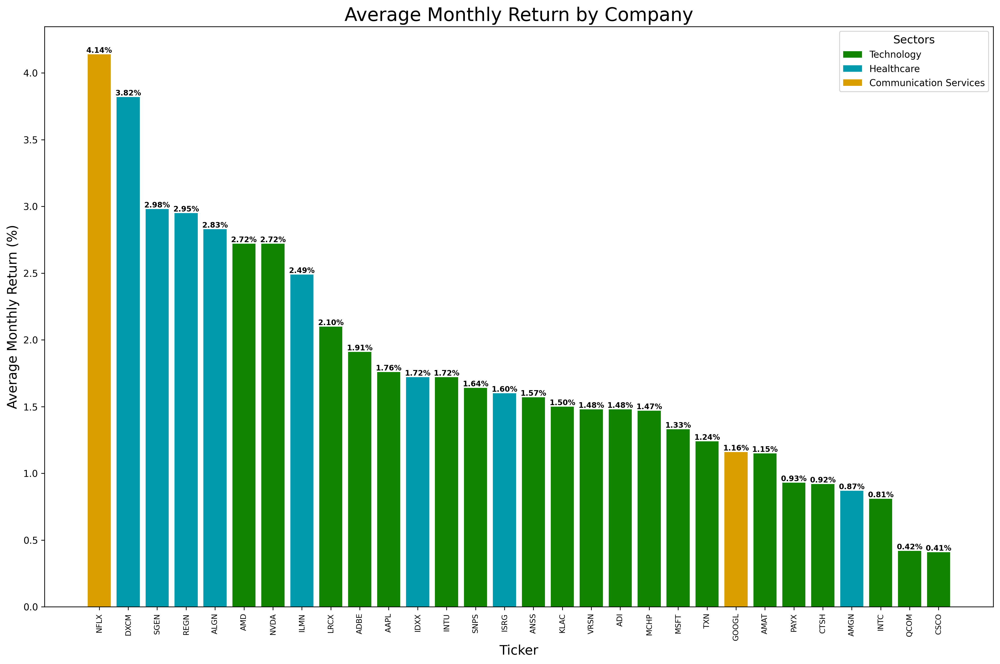

In [482]:
# Calculate average monthly returns for each TICKER
avg_returns = df.groupby('TICKER')['monthly_return'].mean().sort_values(ascending=False)

# Convert to percentage and round to 2 decimal places
avg_returns = (avg_returns * 100).round(2)

# Get the corresponding sector for each TICKER
sectors = df.groupby('TICKER')['sector'].first()

# Create a color map for sectors
unique_sectors = df['sector'].unique()
color_map = plt.colormaps['tab20']
sector_colors = {sector: color_map(i/len(unique_sectors)) for i, sector in enumerate(unique_sectors)}

# Set specific colors for Healthcare, Communication Services, and Technology
sector_colors['Healthcare'] = '#009AAD'
sector_colors['Communication Services'] = '#DB9E00'
sector_colors['Technology'] = '#118501'

# Create a list of colors for each bar based on the sector
bar_colors = [sector_colors[sectors[ticker]] for ticker in avg_returns.index]

# Create a bar plot
plt.figure(figsize=(15, 10), dpi=300)
bars = plt.bar(avg_returns.index, avg_returns.values, color=bar_colors)

# Customize the plot
plt.title('Average Monthly Return by Company', fontsize=20)
plt.xlabel('Ticker', fontsize=14)
plt.ylabel('Average Monthly Return (%)', fontsize=14)
plt.xticks(rotation=90, ha='center', fontsize=8)
plt.tight_layout()

# Add value labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height,
             f'{height:.2f}%',
             ha='center', va='bottom', fontweight='bold', color='black', 
             fontsize=8)

# Create a legend for sectors
legend_elements = [plt.Rectangle((0,0),1,1, facecolor=color, edgecolor='none') for color in sector_colors.values()]
plt.legend(legend_elements, sector_colors.keys(), loc='upper right', title='Sectors', fontsize=10, title_fontsize=12)

# Show the plot
plt.show()

#### Correlation

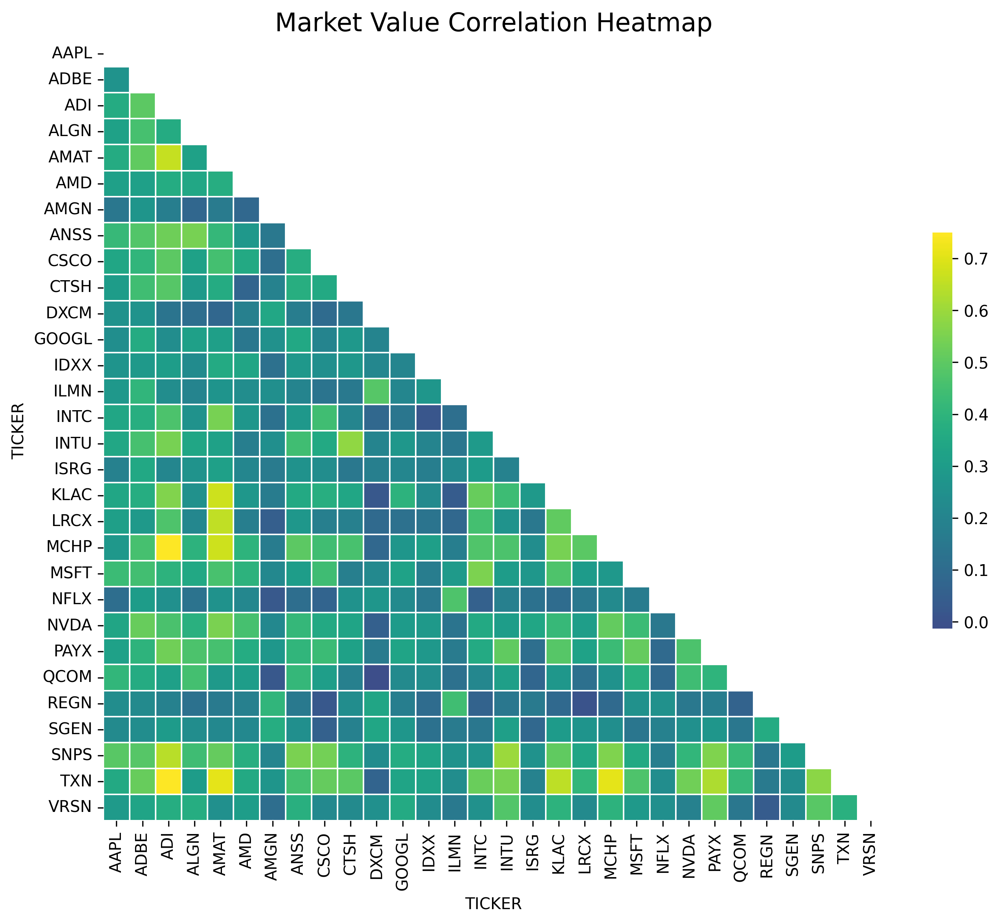

In [1004]:
# Create a pivot table where dates become rows, TICKER becomes columns, and values are monthly_return
df_pivot = df.pivot(index='date_fin', columns='TICKER', values='monthly_return')

# df_pivot.drop(columns='date_fin', axis=1, inplace=True)
corr = df_pivot.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9), dpi=300)

# Generate a custom diverging colormap
# cmap = sns.diverging_palette(230, 20, as_cmap=True)


# Draw the heatmap with the mask and correct aspect ratio
plt.title('Market Value Correlation Heatmap', fontsize=16)  # Add title
sns.heatmap(corr, mask=mask, cmap="viridis", vmax=0.75, center=0.25,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.savefig('heatmap.png', bbox_inches='tight')

In [681]:

def corr_simple(data=None, sig=0.3):
  """
  Generates a correlation heatmap for the provided DataFrame,
  filtering for correlations with an absolute value greater than sig.

  Args:
    data: pandas DataFrame. Defaults to None.
    sig:  Threshold for correlation significance. Defaults to 0.5.
  """

  # Convert data to numeric for correlation calculation
  df_cor = data.apply(lambda x: pd.factorize(x)[0] if x.dtype == 'object' else x)

  # Calculate correlation matrix
  cor_matrix = df_cor.corr()

  # Filter for significant correlations
  cor_matrix = cor_matrix[abs(cor_matrix) > sig]

  # Generate heatmap
  plt.figure(figsize=(12, 10))
  sns.heatmap(cor_matrix, annot=True, cmap='coolwarm', fmt=".2f", center=0)
  plt.title('Correlation Matrix (Significant Correlations)')
  plt.show()

# Example usage:
# Assuming 'df' is your pandas DataFrame
# corr_simple(data=df[X])

In [485]:
# corr_matrix = df[X].corr()

# plt.figure(figsize=(12, 8))
# sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
# plt.title('Correlation Matrix')
# plt.show()

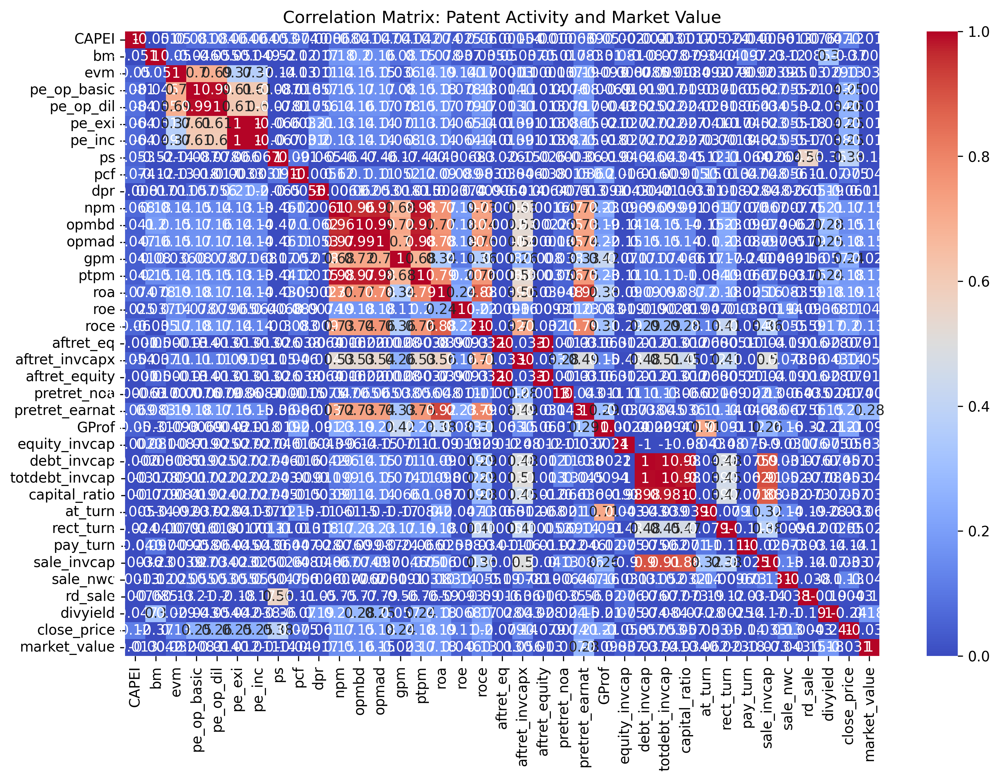

In [682]:
financial_ratios = ['CAPEI', 'bm', 'evm', 'pe_op_basic', 'pe_op_dil', 'pe_exi','pe_inc','ps', 'pcf', 'dpr', 'npm', 'opmbd', 'opmad', 'gpm', 'ptpm', 'roa','roe', 'roce', 'aftret_eq', 'aftret_invcapx', 'aftret_equity','pretret_noa','pretret_earnat', 'GProf', 'equity_invcap','debt_invcap', 'totdebt_invcap', 'capital_ratio', 'at_turn','rect_turn', 'pay_turn', 'sale_invcap', 'sale_nwc', 'rd_sale','divyield', 'close_price']

# corr_features = financial_ratios_dict.copy

corr_features = financial_ratios + ['market_value']
corr_matrix = df[corr_features].corr()
# ticklabels = [value for k, value in corr_features.items()]
# corr_features
plt.figure(figsize=(12, 8), dpi=300)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0.5, vmax=1, vmin=0)
plt.title('Correlation Matrix: Patent Activity and Market Value')
plt.show()

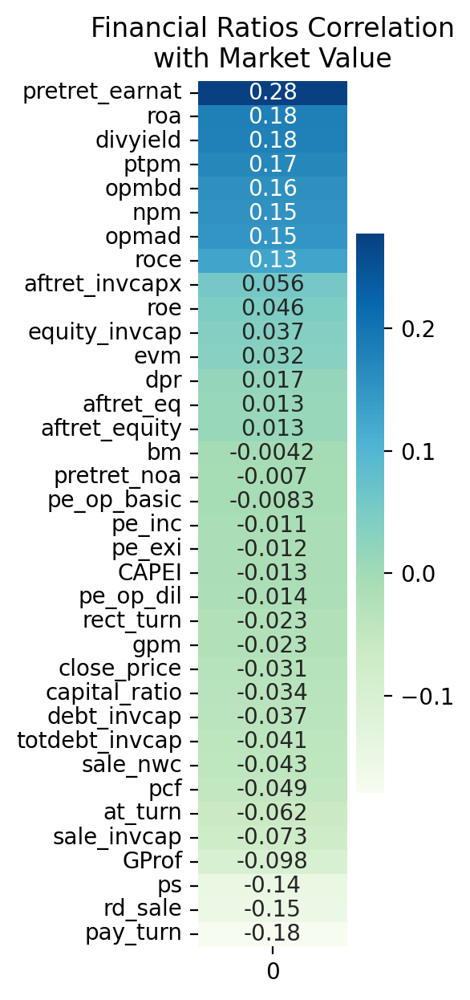

In [694]:
corr_with_target = df[financial_ratios].corrwith(df['market_value'])

# Sort features by correlation with target variable
corr_with_target = corr_with_target.sort_values(ascending=False)

# Plot the heatmap
plt.figure(figsize=(1.5, 7), dpi=200)
sns.heatmap(corr_with_target.to_frame(), cmap='GnBu', annot=True)
plt.title('Financial Ratios Correlation\nwith Market Value')
plt.savefig('fin_corr_value.png', bbox_inches='tight')
plt.show()

### Patenting Activity

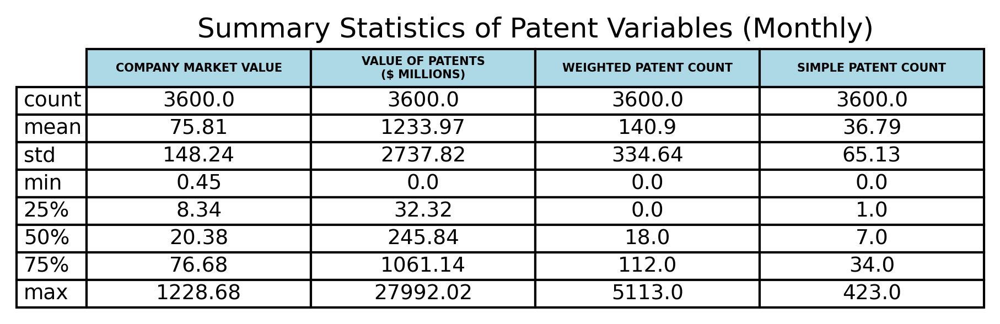

In [761]:

cols = ['market_value', 'xi_nominal', 'wpc', 'spc' ]
col_names = ['Company Market Value', 'Value of Patents\n($ millions)', 'Weighted Patent Count', 'Simple Patent Count']
# Calculate summary statistics for the dataframe
summary_stats = df[cols].describe()

# Create a new figure for the table
plt.figure(figsize=(7, 2), dpi=300)

# Create a table from the summary statistics
table = plt.table(cellText=summary_stats.round(2).values,
          colLabels=[name.upper() for name in col_names],
          rowLabels=summary_stats.index,
          cellLoc='center',
          loc='center')


# Set the font weight of the table text to bold and increase font size
for (i, j), cell in table.get_celld().items():
    if i == 0:  # Top row
        cell.set_height(0.15)
        cell.set_facecolor('lightblue')
        cell.set_fontsize(5)
        cell.set_text_props(weight='bold')  # Make all text bold and increase font size
    else:
        # cell.auto_set_font_size(False)
        cell.set_fontsize(9)
    

table.auto_set_font_size(False)
# table.set_fontsize(9)
# Hide axes
plt.axis('off')

# Set title
plt.title('Summary Statistics of Patent Variables (Monthly)')

# Show the plot
plt.show()


In [993]:
total_spc = df['spc'].sum()
print(f'Total SPC: {total_spc}')


Total SPC: 132431.0


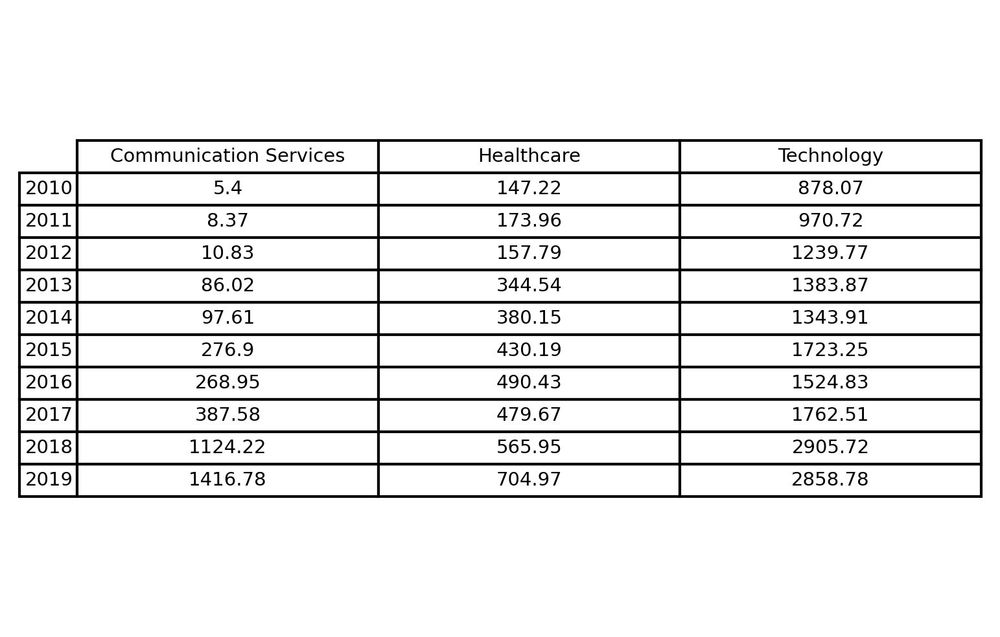

In [1002]:
average_xi_by_sector = df.groupby(['sector', df['date_fin'].dt.year])['xi_nominal'].mean().unstack().reset_index()
average_xi_by_sector.columns.name = None  # Remove the name of the index
average_xi_by_sector.columns = ['Sector'] + [str(year) for year in average_xi_by_sector.columns[1:]]  # Set column names


# Calculate average market return by sector and year
avg_returns = df.groupby([df['date_fin'].dt.year, 'sector'])['xi_nominal'].mean().unstack()

# Convert to percentage and round to 2 decimal places
avg_returns = (avg_returns).round(2)

# Create a matplotlib visualization of the table
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)  # Reduced width

# Hide axes
ax.axis('off')

# Create the table
table = ax.table(cellText=avg_returns.values,
                 rowLabels=avg_returns.index,
                 colLabels=avg_returns.columns,
                 cellLoc='center',
                 loc='center')


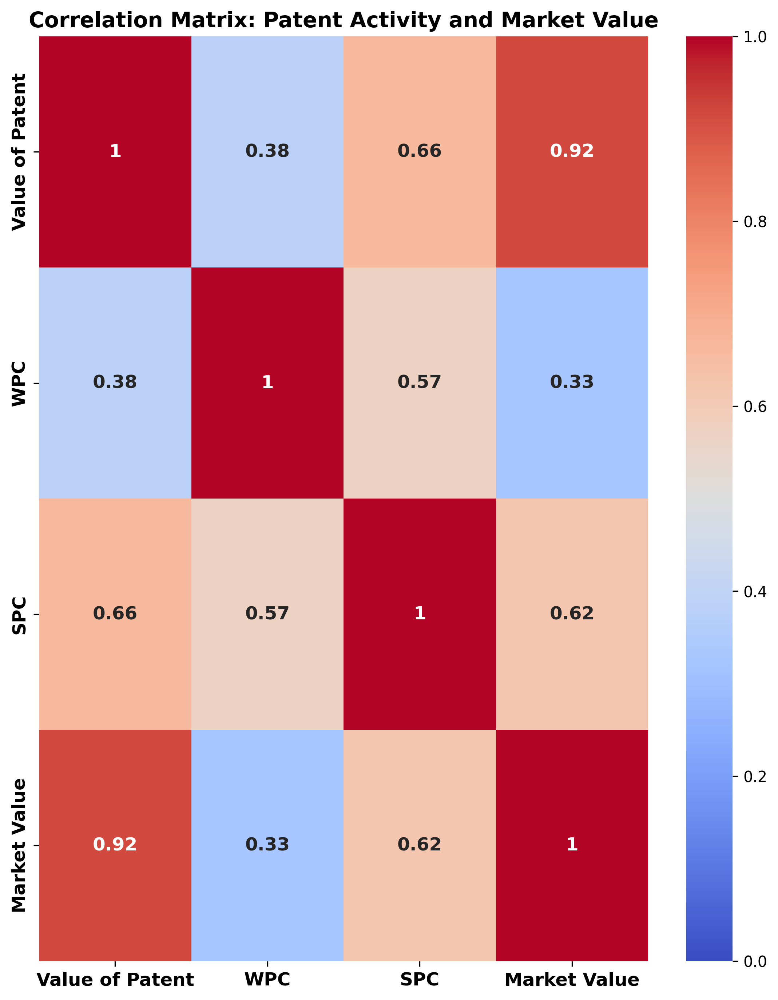

In [767]:
corr_features = {'xi_nominal': 'Value of Patent', 'wpc': 'WPC', 'spc': 'SPC'} 
corr_features['market_value'] = 'Market Value'
corr_matrix = df[corr_features.keys()].corr()
ticklabels = [value for k, value in corr_features.items()]
corr_features
plt.figure(figsize=(9, 11), dpi=300)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0.5, vmax=1, vmin=0, yticklabels=ticklabels, xticklabels=ticklabels, annot_kws={"size": 12, "weight": "bold"})  # Increased font size and made it bold
plt.title('Correlation Matrix: Patent Activity and Market Value', fontsize=14, fontweight='bold')  # Increased font size and made it bold
plt.savefig('patent_corr_value.png', bbox_inches='tight')
plt.show()


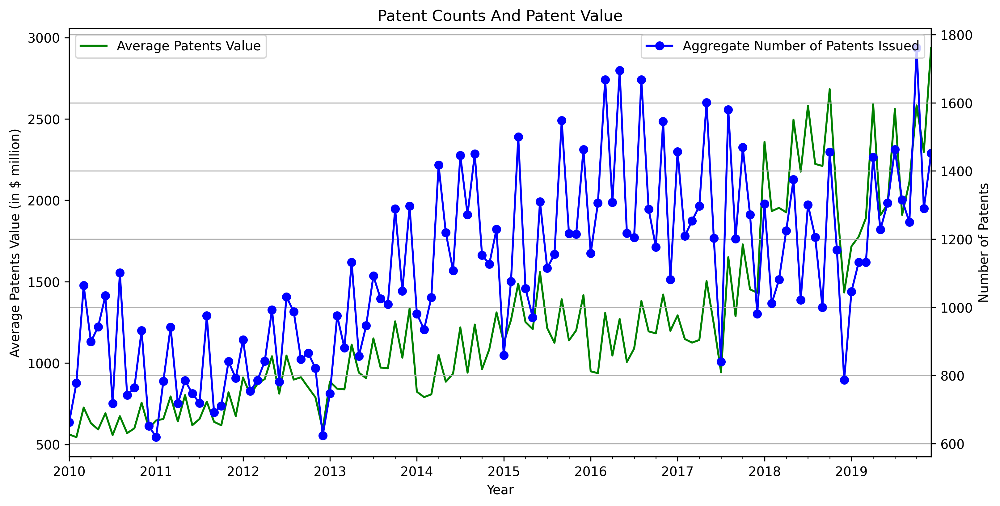

In [771]:
# Sum spc for each unique date and plot the result over time
spc_sum_over_time = df.groupby('date_fin')['spc'].sum()

# # Calculate average monthly return for each unique date
avg_xi = df.groupby('date_fin')['xi_nominal'].mean()

# Plot the average monthly return over time
fig, ax1 = plt.subplots(figsize=(12, 6), dpi=300)
avg_xi.plot(kind='line', linestyle='-', color='green', ax=ax1)
ax1.set_title('Patent Counts And Patent Value')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Patents Value (in $ million)')
ax1.set_label('test')
ax1.legend(['Average Patents Value'], loc='upper left')

# Calculate and plot the percentage change of the average monthly return
ax2 = ax1.twinx()
# avg_monthly_return.pct_change().plot(kind='line', marker='o', linestyle='-', color='blue', ax=ax2)
spc_sum_over_time.plot(kind='line', marker='o', linestyle='-', color='blue', ax=ax2)
ax2.set_ylabel('Number of Patents')
# plt.legend()
ax2.legend(['Aggregate Number of Patents Issued'], loc='upper right')

plt.xticks(rotation=45)
plt.grid(True)
plt.show()


# Machine Learning

In [542]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error, root_mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import visualkeras

## Feature Engineering

In [489]:
ml_df = df.copy()

tickers_avail = ml_df["TICKER"].unique()
tickers_df = pd.DataFrame({
    "ticker": tickers_avail,
    "ticker_number": list(range(len(tickers_avail)))
})

In [490]:
ml_df["year"] = ml_df["date_fin"].dt.year
ml_df["month"] = ml_df["date_fin"].dt.month
ml_df["day"] = ml_df["date_fin"].dt.day

In [491]:
# Represent tickers as numbers to avoid text values
ml_df["ticker_cat"] = pd.Categorical(ml_df["TICKER"])
ml_df["sector_cat"] = pd.Categorical(ml_df["sector"])
ml_df["sector_id"]  = ml_df["sector_cat"].cat.codes
ml_df["ticker_id"]  = ml_df["ticker_cat"].cat.codes

ml_df.drop(["TICKER", "ticker_cat", "sector_cat", "gvkey", "permnofin"], inplace=True, axis=1)

In [492]:
df.describe()

,date_fin,gvkey,permnofin,CAPEI,bm,evm,pe_op_basic,pe_op_dil,pe_exi,pe_inc,...,cshtrd,market_value,xi_nominal,xi_real,wpc,spc,year,month,close_price,monthly_return
count,3600,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000,...,3.600000e+03,3600.000000,3600.000000,3600.000000,3600.000000,3600.000000,3600.00000,3600.000000,3600.000000,3600.000000
mean,2015-01-14 14:24:00,54411.766667,66397.433333,58.208452,0.227959,10.329981,20.625606,21.978997,24.389805,24.163301,...,9.039867e+06,75.812271,1233.974809,511.277978,140.898333,36.786389,2014.50000,6.500000,67.130315,0.017953
min,2010-01-31 00:00:00,1161.000000,10107.000000,-1926.300000,0.000000,-2200.000000,-1621.000000,-1621.000000,-1426.500000,-1426.500000,...,1.784516e+05,0.445739,0.000000,0.000000,0.000000,0.000000,2010.00000,1.000000,0.210733,-0.490191
25%,2012-07-23 06:00:00,6565.000000,59328.000000,18.296750,0.112000,10.998750,11.277750,11.557750,11.433500,11.291750,...,1.063088e+06,8.338265,32.324733,14.010048,0.000000,1.000000,2012.00000,3.750000,22.318404,-0.022135
50%,2015-01-15 12:00:00,24498.500000,76943.500000,28.709000,0.208000,14.360000,19.595500,19.983000,20.641000,20.348500,...,2.492359e+06,20.383342,245.837287,103.744606,18.000000,7.000000,2014.50000,6.500000,41.792666,0.016285
75%,2017-07-07 18:00:00,117768.000000,86580.000000,46.971000,0.319000,19.157000,30.102000,31.156000,33.338500,32.743500,...,1.027595e+07,76.679814,1061.144792,432.932470,112.000000,34.000000,2017.00000,9.250000,74.573727,0.055724
max,2019-12-31 00:00:00,162887.000000,90664.000000,21073.500000,0.899000,566.434000,417.078000,435.949000,489.500000,489.500000,...,1.606490e+08,1228.677028,27992.015250,10892.936873,5113.000000,423.000000,2019.00000,12.000000,557.390015,0.571367
std,NaN,58534.794358,26312.125702,587.045742,0.140955,79.268496,64.362089,65.733202,69.180066,69.315096,...,1.495393e+07,148.243015,2737.823554,1121.291981,334.642826,65.134052,2.87268,3.452532,77.444709,0.075243


In [493]:
# id_vars = ['sector_id', 'ticker_id']
# X_cols = ml_df.select_dtypes(include=[np.number,]).columns.tolist()
# X_cols = [col for col in X_cols if col not in id_vars]
# X_cols.remove('market_value')
y_col = 'market_value'

In [494]:
financial_ratios = ['CAPEI', 'bm', 'evm', 'pe_op_basic', 'pe_op_dil', 'pe_exi','pe_inc','ps', 'pcf', 'dpr', 'npm', 'opmbd', 'opmad', 'gpm', 'ptpm', 'roa','roe', 'roce', 'aftret_eq', 'aftret_invcapx', 'aftret_equity','pretret_noa','pretret_earnat', 'GProf', 'equity_invcap','debt_invcap', 'totdebt_invcap', 'capital_ratio', 'at_turn','rect_turn', 'pay_turn', 'sale_invcap', 'sale_nwc', 'rd_sale','divyield', 'close_price']

patent_metrics = ['xi_nominal', 'wpc', 'spc']

market_sentiment = ['us_inst_crash', 'us_ind_crash', 'us_inst_valuation','us_ind_valuation']

id_vars = ['sector_id', 'ticker_id']

temporal = ['year', 'month', 'day']

## XGBoost


In [658]:
train_split = 0.7
# Set the date at which to split train and eval data
dates_avail = ml_df["date_fin"].unique()
split_date_index = int(dates_avail.shape[0] * train_split)
split_date = dates_avail[split_date_index]
# Train data is on or before the split date
train_df = ml_df.query("date_fin <= @split_date")
# And eval data is after
test_df = ml_df.query("date_fin > @split_date")

features = financial_ratios + patent_metrics + market_sentiment + temporal + id_vars
label = y_col
print(features)

X_train = train_df[features]
y_train = train_df[label]
X_test = test_df[features]
y_test = test_df[label]

feature_to_scale = financial_ratios + patent_metrics + market_sentiment
# Scale the features
scaler = MinMaxScaler()
X_train.loc[:,feature_to_scale] = scaler.fit_transform(X_train[feature_to_scale])
X_test.loc[:,feature_to_scale] = scaler.transform(X_test[feature_to_scale])


X_train_xgb = X_train
X_test_xgb = X_test


['CAPEI', 'bm', 'evm', 'pe_op_basic', 'pe_op_dil', 'pe_exi', 'pe_inc', 'ps', 'pcf', 'dpr', 'npm', 'opmbd', 'opmad', 'gpm', 'ptpm', 'roa', 'roe', 'roce', 'aftret_eq', 'aftret_invcapx', 'aftret_equity', 'pretret_noa', 'pretret_earnat', 'GProf', 'equity_invcap', 'debt_invcap', 'totdebt_invcap', 'capital_ratio', 'at_turn', 'rect_turn', 'pay_turn', 'sale_invcap', 'sale_nwc', 'rd_sale', 'divyield', 'close_price', 'xi_nominal', 'wpc', 'spc', 'us_inst_crash', 'us_ind_crash', 'us_inst_valuation', 'us_ind_valuation', 'year', 'month', 'day', 'sector_id', 'ticker_id']


In [659]:
X_train_xgb

,CAPEI,bm,evm,pe_op_basic,pe_op_dil,pe_exi,pe_inc,ps,pcf,dpr,...,spc,us_inst_crash,us_ind_crash,us_inst_valuation,us_ind_valuation,year,month,day,sector_id,ticker_id
0,0.085657,0.225806,0.667616,0.556839,0.514828,0.755559,0.755559,0.075090,0.427457,0.0,...,0.087470,0.593176,0.679691,0.515021,0.841206,2010,1,31,2,0
1,0.085876,0.224694,0.664677,0.534326,0.490923,0.744892,0.744892,0.073405,0.424478,0.0,...,0.078014,0.552231,0.688323,0.569206,0.773869,2010,2,28,2,0
2,0.086199,0.224694,0.664677,0.534442,0.491047,0.744948,0.744948,0.085241,0.428637,0.0,...,0.094563,0.718110,0.587460,0.543187,0.720603,2010,3,31,2,0
3,0.086471,0.224694,0.664677,0.534542,0.491153,0.744995,0.744995,0.095215,0.432148,0.0,...,0.111111,0.777428,0.685597,0.446888,0.688107,2010,4,30,2,0
4,0.086115,0.221357,0.665417,0.534397,0.490999,0.744926,0.744926,0.085143,0.427779,0.0,...,0.101655,0.812073,0.782372,0.410139,0.790285,2010,5,31,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3560,0.084771,0.194661,0.669386,0.556752,0.519232,0.757525,0.757525,0.141147,0.419570,0.0,...,0.004728,0.437795,0.716493,0.050429,0.254606,2016,9,30,2,29
3561,0.084841,0.194661,0.669386,0.558466,0.521385,0.758485,0.758485,0.151121,0.421109,0.0,...,0.007092,0.303937,0.674239,0.132511,0.152429,2016,10,31,2,29
3562,0.084722,0.194661,0.669102,0.555478,0.517701,0.756841,0.756841,0.138736,0.419195,0.0,...,0.002364,0.177428,0.575193,0.122049,0.109883,2016,11,30,2,29
3563,0.084675,0.194661,0.669102,0.554705,0.516727,0.756407,0.756407,0.131721,0.418116,0.0,...,0.002364,0.240420,0.481145,0.000000,0.000000,2016,12,31,2,29


In [779]:
import optuna
import xgboost as xgb

def objective(trial):
 
    dtrain = xgb.DMatrix(X_train_xgb, label=y_train)
    dvalid = xgb.DMatrix(X_test_xgb, label=y_test)

    param = {
        "verbosity": 0,
        "objective": "reg:squarederror",
        "tree_method": "exact",
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        "subsample": trial.suggest_float("subsample", 0.2, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
    }

    if param["booster"] in ["gbtree", "dart"]:
        param["max_depth"] = trial.suggest_int("max_depth", 3, 9, step=2)
        param["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
        param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
        param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])

    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
        param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)

    bst = xgb.train(param, dtrain)
    preds = bst.predict(dvalid)
    mse = mean_squared_error(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    return mse  # Optuna minimizes the objective function

if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objective, n_trials=500, timeout=600)

    print("Number of finished trials: ", len(study.trials))
    print("Best trial:")
    trial = study.best_trial

    best_params = trial.params
    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))


[I 2024-09-12 12:38:36,704] A new study created in memory with name: no-name-cc771274-4dc1-4d37-8d6a-c691b6ab8105
[I 2024-09-12 12:38:36,829] Trial 0 finished with value: 47936.915854427934 and parameters: {'booster': 'dart', 'lambda': 0.39260590996047623, 'alpha': 2.4551517904179875e-06, 'subsample': 0.349738947891839, 'colsample_bytree': 0.5875930450955026, 'max_depth': 9, 'min_child_weight': 8, 'eta': 1.064743838761084e-08, 'gamma': 1.2264800031383775e-05, 'grow_policy': 'depthwise', 'sample_type': 'uniform', 'normalize_type': 'forest', 'rate_drop': 3.114064215846391e-05, 'skip_drop': 2.895137164449912e-08}. Best is trial 0 with value: 47936.915854427934.
[I 2024-09-12 12:38:36,849] Trial 1 finished with value: 42454.70172804498 and parameters: {'booster': 'gblinear', 'lambda': 0.3668158363330428, 'alpha': 6.510651088561297e-08, 'subsample': 0.548635111196918, 'colsample_bytree': 0.9992734229729356}. Best is trial 1 with value: 42454.70172804498.
[I 2024-09-12 12:38:36,922] Trial 2 

Number of finished trials:  500
Best trial:
  Value: 8244.982288980058
  Params: 
    booster: gblinear
    lambda: 6.83492210612145e-08
    alpha: 9.518639213267593e-05
    subsample: 0.6159538803478226
    colsample_bytree: 0.7715379687985191


In [781]:
best_params = {'booster': 'gbtree',
 'lambda': 0.0013137398659094227,
 'alpha': 0.38082532431856875,
 'subsample': 0.7926883831883597,
 'colsample_bytree': 0.9646885844658596,
 'max_depth': 7,
 'min_child_weight': 5,
 'eta': 0.5503065938779447,
 'gamma': 2.781569719876686e-08,
 'grow_policy': 'lossguide'}

{'booster': 'gblinear',
 'lambda': 0.012258241497011884,
 'alpha': 0.9985015454257481,
 'subsample': 0.6703383197097775,
 'colsample_bytree': 0.8287185701241804}


 {'booster': 'dart',
 'lambda': 0.00038086914239388096,
 'alpha': 0.006479499252722109,
 'subsample': 0.8400070911816189,
 'colsample_bytree': 0.2666727508881003,
 'max_depth': 7,
 'min_child_weight': 2,
 'eta': 0.9974786203637789,
 'gamma': 0.004251145143795264,
 'grow_policy': 'lossguide',
 'sample_type': 'weighted',
 'normalize_type': 'forest',
 'rate_drop': 1.740514190457748e-05,
 'skip_drop': 0.000681909094893837}

FINAL: {'booster': 'gbtree',
 'lambda': 0.11093727994251816,
 'alpha': 0.24690086350265578,
 'subsample': 0.9689737572415619,
 'colsample_bytree': 0.7835152819386699,
 'max_depth': 5,
 'min_child_weight': 3,
 'eta': 0.7283159759844647,
 'gamma': 6.222718488913067e-05,
 'grow_policy': 'depthwise'}

In [654]:
eval_set = [(X_train_xgb, y_train), (X_test_xgb, y_test)]

parameters = {
    'n_estimators': [400],
    'learning_rate': [0.001, 0.01, 0.05],
    'max_depth': [6, 7],
    'gamma': [0.01, 0.02, 0.05],
    'random_state': [42]
}

model = xgb.XGBRegressor(eval_set=eval_set, objective='reg:squarederror', verbose=True)
clf = GridSearchCV(model, parameters)
clf.fit(X_train_xgb, y_train)
print(f'Best params: {clf.best_params_}')
print(f'Best validation score = {clf.best_score_}')

CVbest_params = clf.best_params_

KeyboardInterrupt: 

MAE of the base model: 51.3029
MAPE of the base model: 52.6527%
Mean Squared Error: 10034.6227
Root Mean Squared Error: 100.1730
R-squared Score: 0.7727


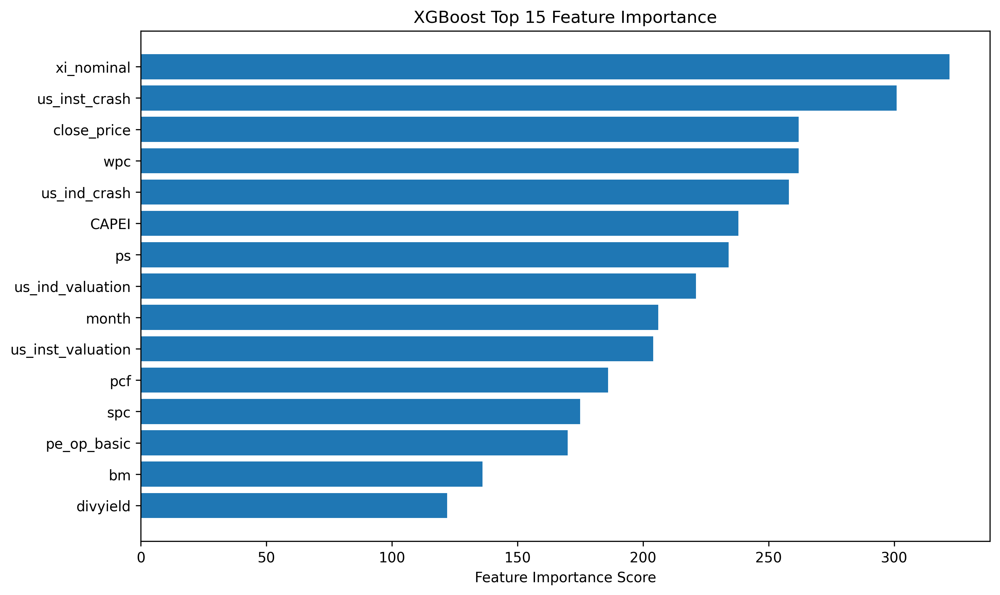

In [784]:
# Initialize and train the XGBoost model
xgb_model = xgb.XGBRegressor(**best_params, objective='reg:squarederror')
# xgb_model.set_params(**best_params)

xgb_model.fit(X_train_xgb, y_train)

# Make predictions
y_pred = xgb_model.predict(X_test_xgb)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"MAE of the base model: {mae:.4f}")
print(f"MAPE of the base model: {(mape*100):.4f}%")
print(f"Mean Squared Error: {mse:.4f}")
print(f"Root Mean Squared Error: {rmse:.4f}")
print(f"R-squared Score: {r2:.4f}")


# Feature importance labeling
xgb_model.get_booster().feature_names = list(X_train.columns)

fscores = xgb_model.get_booster().get_fscore()
feature_importance = xgb_model.feature_importances_
feature_names = X_train.columns

fscores_df = pd.DataFrame({'feature': fscores.keys(), 'fscore': fscores.values()})
fscores_df.sort_values('fscore',inplace=True, ascending=False)
fscores_df.head()

# Select top 15 features
top_15_features = fscores_df['feature'][:15]
top_15_importance = fscores_df['fscore'][:15]


# Plot feature importance for top 15 features
plt.figure(figsize=(10, 6), dpi=300)
plt.barh(range(len(top_15_importance)), top_15_importance[::-1])
plt.yticks(range(len(top_15_importance)), top_15_features[::-1])
plt.xlabel(f"Feature Importance Score")
plt.title('XGBoost Top 15 Feature Importance')
plt.tight_layout()
plt.savefig('feature_importance.png', bbox_inches='tight')
plt.show()


In [662]:
dtrain = xgb.DMatrix(X_train_xgb, label=y_train)
dvalid = xgb.DMatrix(X_test_xgb, label=y_test)

evals = [(dtrain, "train"), (dvalid, "validation")]
n = 10000

model = xgb.train(
   params=best_params,
   dtrain=dtrain,
   num_boost_round=n,
   evals=evals,
   verbose_eval=10, # Every ten rounds
   early_stopping_rounds=50
)

[0]	train-rmse:59.72944	validation-rmse:159.79390
[10]	train-rmse:13.00449	validation-rmse:102.73716
[20]	train-rmse:9.21983	validation-rmse:101.78188
[30]	train-rmse:7.46375	validation-rmse:101.84028
[40]	train-rmse:6.46683	validation-rmse:100.67208
[50]	train-rmse:5.78545	validation-rmse:98.26362
[60]	train-rmse:5.20477	validation-rmse:99.27985
[70]	train-rmse:4.70986	validation-rmse:98.50726
[80]	train-rmse:4.37589	validation-rmse:97.96533
[90]	train-rmse:4.11787	validation-rmse:97.98795
[100]	train-rmse:3.84816	validation-rmse:97.70058
[110]	train-rmse:3.65992	validation-rmse:97.62495
[120]	train-rmse:3.44512	validation-rmse:96.47072
[130]	train-rmse:3.23421	validation-rmse:96.11319
[140]	train-rmse:3.05066	validation-rmse:96.03399
[150]	train-rmse:2.90591	validation-rmse:96.04421
[160]	train-rmse:2.74001	validation-rmse:95.99473
[170]	train-rmse:2.63390	validation-rmse:96.13583
[180]	train-rmse:2.50318	validation-rmse:95.86546
[190]	train-rmse:2.37375	validation-rmse:96.08132
[200

### CV

In [663]:
params = {"objective": "reg:squarederror", "tree_method": "hist"}
n = 1000

results = xgb.cv(
   best_params, dtrain,
   num_boost_round=n,
   nfold=5,
   early_stopping_rounds=20
)

results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,59.792694,1.280205,60.261882,7.846987
1,35.510918,2.654639,36.593855,4.029248
2,26.193896,1.319821,27.648678,3.594941
3,20.317905,1.244713,22.632325,3.352774
4,17.951448,1.221281,20.416414,2.929658


In [664]:
results

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,59.792694,1.280205,60.261882,7.846987
1,35.510918,2.654639,36.593855,4.029248
2,26.193896,1.319821,27.648678,3.594941
3,20.317905,1.244713,22.632325,3.352774
4,17.951448,1.221281,20.416414,2.929658
...,...,...,...,...
196,1.987872,0.134323,11.487339,2.442180
197,1.978140,0.133161,11.487081,2.443577
198,1.965878,0.133283,11.485917,2.444333
199,1.958849,0.134965,11.486882,2.449269


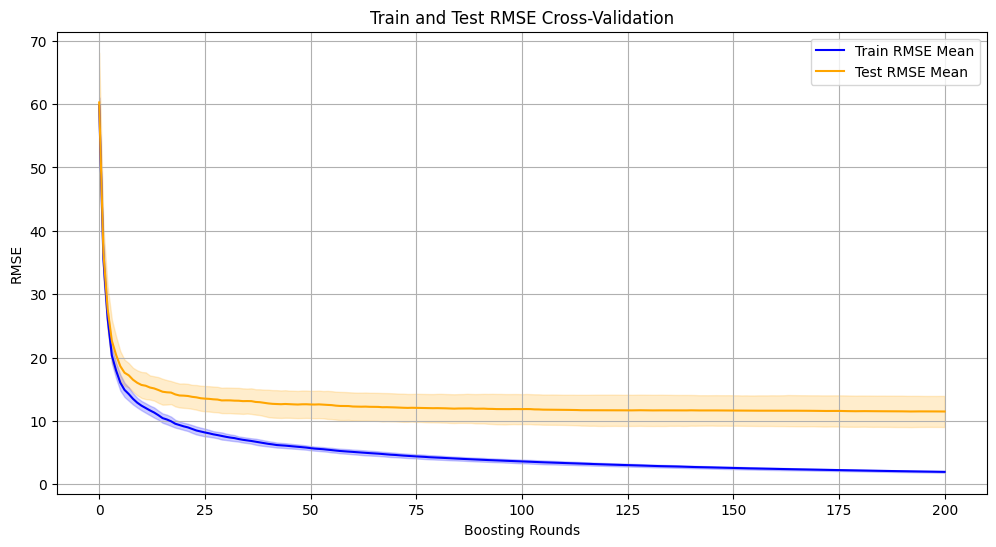

In [665]:
plt.figure(figsize=(12, 6))
plt.plot(results['train-rmse-mean'], label='Train RMSE Mean', color='blue')
plt.fill_between(results.index, 
                 results['train-rmse-mean'] - results['train-rmse-std'], 
                 results['train-rmse-mean'] + results['train-rmse-std'], 
                 color='blue', alpha=0.2)

plt.plot(results['test-rmse-mean'], label='Test RMSE Mean', color='orange')
plt.fill_between(results.index, 
                 results['test-rmse-mean'] - results['test-rmse-std'], 
                 results['test-rmse-mean'] + results['test-rmse-std'], 
                 color='orange', alpha=0.2)

# plt.axvline(x=20, color='red', linestyle='--', label='Elbow at n=20')

plt.title('Train and Test RMSE Cross-Validation')
plt.xlabel('Boosting Rounds')
plt.ylabel('RMSE')
plt.legend()
plt.grid()
plt.show()



### Evaluate Model

In [785]:
# Create a final dataframe to verify the predictions
df_pred = X_test.copy()
df_train = X_train.copy()
# Recreate a column for the complete date
date_columns = ["year", "month", "day"]
df_pred['date'] = pd.to_datetime(df_pred[date_columns])
df_train['date'] = pd.to_datetime(df_train[date_columns])
df_pred.drop(date_columns, inplace=True, axis=1)
df_train.drop(date_columns, inplace=True, axis=1)

In [786]:
df_pred[f"{y_col}_pred"] = xgb_model.predict(X_test)

In [787]:
df_pred = df_pred.merge(
    y_test, 
    how = "inner", 
    left_index = True, 
    right_index = True
)
df_train = df_train.merge(
    y_train, 
    how = "inner", 
    left_index = True, 
    right_index = True
)

# As well as the ticker names
df_pred = df_pred.merge(
    tickers_df, 
    how = "inner",
    left_on = "ticker_id",
    right_on = "ticker_number"
)

df_train = df_train.merge(
    tickers_df, 
    how = "inner",
    left_on = "ticker_id",
    right_on = "ticker_number"
)

df_pred.drop(["ticker_id", "ticker_number"], inplace=True, axis=1)
df_train.drop(["ticker_id", "ticker_number"], inplace=True, axis=1)

In [788]:
mse = mean_squared_error(
    y_true = df_pred[y_col],
    y_pred = df_pred[f"{y_col}_pred"]
)
mae = mean_absolute_error(
    y_true = df_pred[y_col],
    y_pred = df_pred[f"{y_col}_pred"]
)

# Mean Absolute Percentage Error is the percentage of how off the predicted values are
mape = (
    np.abs(df_pred[y_col] - df_pred[f"{y_col}_pred"]) / df_pred[y_col]
).mean() * 100


print(f"Mean Squared Error is {round(mse, 2)}")
print(f"Mean Absolute Error is {round(mae, 2)}")
print(f"Mean Absolute Percentage Error is {round(mape, 2)}%")

Mean Squared Error is 10034.62
Mean Absolute Error is 51.3
Mean Absolute Percentage Error is 52.65%


In [789]:
df_pred["Squared Error"] = (df_pred[y_col] - df_pred[f"{y_col}_pred"]) ** 2
df_pred["Absolute Error"] = df_pred["Squared Error"].apply(np.abs)
df_pred["Absolute Percentage Error"] = (
    np.abs(df_pred[y_col] - df_pred[f"{y_col}_pred"]) / df_pred[y_col]
) * 100

In [791]:
df_train.ticker.unique()

array(['AAPL', 'ADBE', 'ADI', 'ALGN', 'AMAT', 'AMD', 'AMGN', 'ANSS',
       'CSCO', 'CTSH', 'DXCM', 'GOOGL', 'IDXX', 'ILMN', 'INTC', 'INTU',
       'ISRG', 'KLAC', 'LRCX', 'MCHP', 'MSFT', 'NFLX', 'NVDA', 'PAYX',
       'QCOM', 'REGN', 'SGEN', 'SNPS', 'TXN', 'VRSN'], dtype=object)

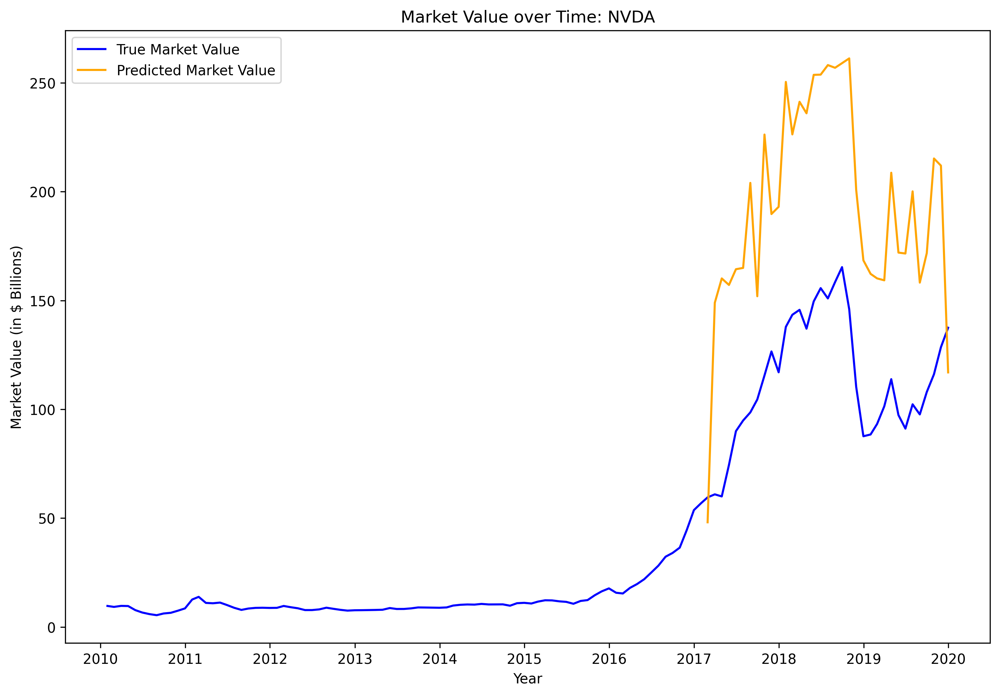

In [800]:
# Prepare data for visualisation
ticker = "NVDA"
df_train_viz = df_train[df_train['ticker'] == ticker]
df_pred_viz = df_pred[df_pred['ticker'] == ticker]

df_pred_viz = df_pred_viz.melt(
    id_vars=["ticker", "date"],
    value_vars=[f"{y_col}_pred", y_col],
    var_name="value_type",
    value_name="value"
)

df_train_viz = df_train_viz.melt(
    id_vars=["ticker", "date"],
    value_vars=[y_col],
    var_name="value_type",
    value_name="value"
)

df_combined = pd.concat([df_train_viz, df_pred_viz])
df_combined = df_combined.sort_values(by='date')


plt.figure(figsize=(12, 8), dpi=300)
# sns.lineplot(data=df_combined, x='date', y='value', hue='value_type')
plt.plot('date', 'value', data=df_combined[df_combined.value_type == y_col], color='blue', label='True Market Value')
plt.plot('date', 'value', data=df_combined[df_combined.value_type == f"{y_col}_pred"], color='orange', label='Predicted Market Value')
plt.title(f"Market Value over Time: {ticker}")
plt.xlabel('Year')
plt.legend()
plt.ylabel('Market Value (in $ Billions)')
plt.savefig(f"xgb_{ticker}.png", bbox_inches='tight')
plt.show()


## CNN

In [953]:
import tensorflow as tf
import keras as keras
from keras.models import Model, Sequential, load_model
from keras.layers import LSTM, Dense, Dropout, Convolution1D, Activation, MaxPooling1D, Flatten, Input
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam

In [941]:
X_train_cnn = X_train.copy()
X_test_cnn = X_test.copy()
y_train_cnn = y_train.to_numpy()
y_test_cnn = y_test.to_numpy()

metrics = [tf.keras.metrics.MeanSquaredError(), tf.keras.metrics.RootMeanSquaredError(), tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.MeanAbsolutePercentageError(), tf.keras.metrics.R2Score()]

In [942]:
X_train_cnn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2550 entries, 0 to 3564
Data columns (total 48 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CAPEI              2550 non-null   float64
 1   bm                 2550 non-null   float64
 2   evm                2550 non-null   float64
 3   pe_op_basic        2550 non-null   float64
 4   pe_op_dil          2550 non-null   float64
 5   pe_exi             2550 non-null   float64
 6   pe_inc             2550 non-null   float64
 7   ps                 2550 non-null   float64
 8   pcf                2550 non-null   float64
 9   dpr                2550 non-null   float64
 10  npm                2550 non-null   float64
 11  opmbd              2550 non-null   float64
 12  opmad              2550 non-null   float64
 13  gpm                2550 non-null   float64
 14  ptpm               2550 non-null   float64
 15  roa                2550 non-null   float64
 16  roe                2550 non-n

In [943]:
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_cnn = scaler.fit_transform(X_train_cnn)
X_test_cnn  = scaler.transform(X_test_cnn)

In [944]:
# Reshape the input data for the model
X_train_cnn = np.array(X_train_cnn).reshape((X_train_cnn.shape[0], X_train_cnn.shape[1], 1))
X_test_cnn = np.array(X_test_cnn).reshape((X_test_cnn.shape[0], X_test_cnn.shape[1], 1))
X_train_cnn.shape

(2550, 48, 1)

### 2 Convolutional Layers

In [945]:
from keras.utils import plot_model

In [949]:
model_2_cnn = Sequential()

# First convolutional layer
model_2_cnn.add(Convolution1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_cnn.shape[1], X_train_cnn.shape[2])))
model_2_cnn.add(MaxPooling1D(pool_size=1))

# Second convolutional layer
model_2_cnn.add(Convolution1D(filters=128, kernel_size=2, activation='relu'))
model_2_cnn.add(MaxPooling1D(pool_size=1))

# Flatten the output
model_2_cnn.add(Flatten())

# Fully connected layer
model_2_cnn.add(Dense(128, activation='relu'))
model_2_cnn.add(Dropout(0.5))
model_2_cnn.add(Dense(1))  # Assuming a regression task

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Compile the model_2_cnn
model_2_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)


# Fit the model_2_cnn
history_2_cnn = model_2_cnn.fit(X_train_cnn, y_train_cnn, epochs=25, batch_size=32, validation_data=(X_test_cnn, y_test_cnn), callbacks=[early_stopping])


Epoch 1/25


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 14120.1680 - mean_absolute_error: 54.0241 - mean_absolute_percentage_error: 251.6146 - mean_squared_error: 16358.2969 - r2_score: 0.4252 - root_mean_squared_error: 127.7340 - val_loss: 46053.9961 - val_mean_absolute_error: 99.9090 - val_mean_absolute_percentage_error: 153.8316 - val_mean_squared_error: 46053.9961 - val_r2_score: -0.0430 - val_root_mean_squared_error: 214.6019
Epoch 2/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9711.0742 - mean_absolute_error: 61.3063 - mean_absolute_percentage_error: 547.6106 - mean_squared_error: 9711.0742 - r2_score: 0.0799 - root_mean_squared_error: 98.4779 - val_loss: 39821.4023 - val_mean_absolute_error: 86.4796 - val_mean_absolute_percentage_error: 87.0475 - val_mean_squared_error: 39821.4023 - val_r2_score: 0.0982 - val_root_mean_squared_error: 199.5530
Epoch 3/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7263.1699 - mean_absolute_error: 49.3997 - mean_absolute_percentage_error: 329.8899

In [950]:
from PIL import ImageFont
# from tensorflow.keras.utils import plot_model
# # font = ImageFont.truetype("arial.ttf", 32)
# # visualkeras.layered_view(model_2_cnn, legend=True)
# plot_model(model_2_cnn, to_file="test2.png", show_shapes=True)

model_2_cnn.summary()

Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_185 (Conv1D)             │ (None, 47, 64)         │           192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_182               │ (None, 47, 64)         │             0 │
│ (MaxPooling1D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_186 (Conv1D)             │ (None, 46, 128)        │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_183               │ (None, 46, 128)        │             0 │
│ (MaxPooling1D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_48 (Flatten)            │ (None, 5888)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_126 (Dense)               │ (None, 128)            │       753,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_119 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,311,877 (8.82 MB)

 Trainable params: 770,625 (2.94 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,541,252 (5.88 MB)

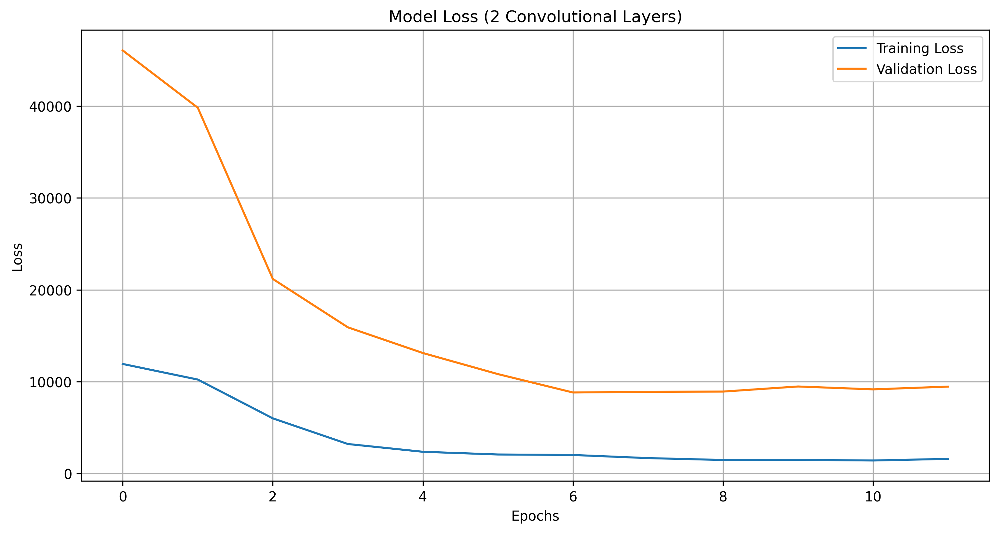

In [951]:

plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_2_cnn.history['loss'], label='Training Loss')
plt.plot(history_2_cnn.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (2 Convolutional Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig("cnn_2.png", bbox_inches='tight')
plt.show()

In [952]:
train_accuracy = model_2_cnn.evaluate(X_train_cnn, y_train_cnn, verbose=0, return_dict=True)
test_accuracy = model_2_cnn.evaluate(X_test_cnn, y_test_cnn, verbose=0, return_dict=True)

print("2-Layer CNN (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

2-Layer CNN (Validation Metrics):
Mean Absolute Error (MAE): 52.7823
Mean Absolute Percentage Error (MAPE): 95.1379%
Mean Squared Error (MSE): 8828.2705
Root Mean Squared Error (RMSE): 93.9589
R2 Score: 0.8001


### 4 Convolutional Layers

In [954]:
model_4_cnn = Sequential()

# First convolutional layer
model_4_cnn.add(Convolution1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_cnn.shape[1], X_train_cnn.shape[2])))
model_4_cnn.add(MaxPooling1D(pool_size=1))

# Second convolutional layer
model_4_cnn.add(Convolution1D(filters=128, kernel_size=2, activation='relu'))
model_4_cnn.add(MaxPooling1D(pool_size=1))

# Third convolutional layer
model_4_cnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_4_cnn.add(MaxPooling1D(pool_size=1))

# Fourth convolutional layer
model_4_cnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_4_cnn.add(MaxPooling1D(pool_size=1))

# Flatten the output
model_4_cnn.add(Flatten())

# Fully connected layer
model_4_cnn.add(Dense(128, activation='relu'))
model_4_cnn.add(Dropout(0.5))
model_4_cnn.add(Dense(1))  # Assuming a regression task

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Compile the model_2_cnn
model_4_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Fit the model_2_cnn
history_4_cnn = model_4_cnn.fit(X_train_cnn, y_train_cnn, epochs=25, batch_size=32, validation_data=(X_test_cnn, y_test_cnn), callbacks=[early_stopping])

Epoch 1/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 14733.8379 - mean_absolute_error: 58.7514 - mean_absolute_percentage_error: 278.7625 - mean_squared_error: 11427.3262 - r2_score: 0.5926 - root_mean_squared_error: 106.8587 - val_loss: 45743.3750 - val_mean_absolute_error: 101.6522 - val_mean_absolute_percentage_error: 169.4701 - val_mean_squared_error: 45743.3750 - val_r2_score: -0.0359 - val_root_mean_squared_error: 213.8770
Epoch 2/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 10720.2275 - mean_absolute_error: 62.8704 - mean_absolute_percentage_error: 586.0098 - mean_squared_error: 10720.2275 - r2_score: 0.0520 - root_mean_squared_error: 103.2148 - val_loss: 22127.1465 - val_mean_absolute_error: 99.4262 - val_mean_absolute_percentage_error: 240.9640 - val_mean_squared_error: 22127.1465 - val_r2_score: 0.4989 - val_root_mean_squared_error: 148.7520
Epoch 3/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3718.9294 - mean_absolute_error: 37.1230 - mean_absolute_percenta

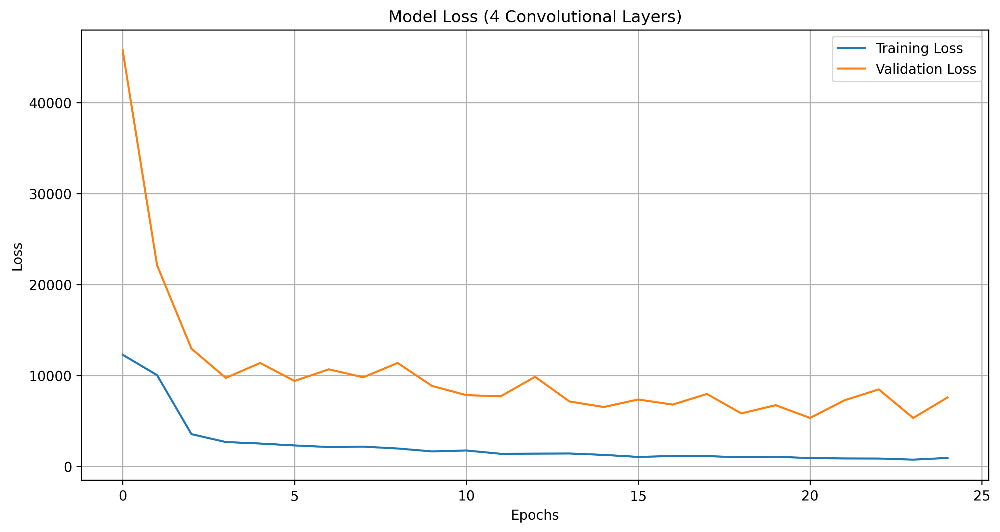

In [955]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_4_cnn.history['loss'], label='Training Loss')
plt.plot(history_4_cnn.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (4 Convolutional Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig("cnn_4.png", bbox_inches='tight')
plt.show()

In [956]:
train_accuracy = model_4_cnn.evaluate(X_train_cnn, y_train_cnn, verbose=0, return_dict=True)
test_accuracy = model_4_cnn.evaluate(X_test_cnn, y_test_cnn, verbose=0, return_dict=True)

print("4-Layer CNN (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

4-Layer CNN (Validation Metrics):
Mean Absolute Error (MAE): 37.2392
Mean Absolute Percentage Error (MAPE): 43.9443%
Mean Squared Error (MSE): 5334.7466
Root Mean Squared Error (RMSE): 73.0394
R2 Score: 0.8792


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


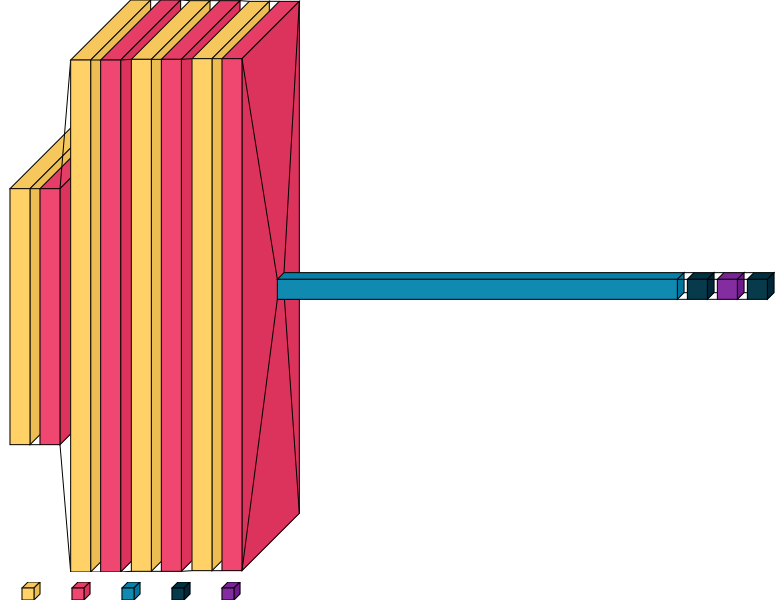

In [268]:
visualkeras.layered_view(model_4_cnn, legend=True)

### 6 Convolutional Layers

In [978]:
model_6_cnn = Sequential()

# First convolutional layer
model_6_cnn.add(Convolution1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_cnn.shape[1], X_train_cnn.shape[2])))
model_6_cnn.add(MaxPooling1D(pool_size=1))

# Second convolutional layer
model_6_cnn.add(Convolution1D(filters=128, kernel_size=2, activation='relu'))
model_6_cnn.add(MaxPooling1D(pool_size=1))

# Third convolutional layer
model_6_cnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_6_cnn.add(MaxPooling1D(pool_size=1))

# Fourth convolutional layer
model_6_cnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_6_cnn.add(MaxPooling1D(pool_size=1))

# Fifth convolutional layer
model_6_cnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_6_cnn.add(MaxPooling1D(pool_size=1))

# Flatten the output
model_6_cnn.add(Flatten())

# Fully connected layer
model_6_cnn.add(Dense(128, activation='relu'))
model_6_cnn.add(Dropout(0.5))
model_6_cnn.add(Dense(1))  # Assuming a regression task

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Compile the model_2_cnn
model_6_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Fit the model_2_cnn
history_6_cnn = model_6_cnn.fit(X_train_cnn, y_train_cnn, epochs=25, batch_size=32, validation_data=(X_test_cnn, y_test_cnn), callbacks=[early_stopping])

/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 12014.4561 - mean_absolute_error: 53.3175 - mean_absolute_percentage_error: 267.1499 - mean_squared_error: 8997.0820 - r2_score: 0.6648 - root_mean_squared_error: 94.6810 - val_loss: 44712.8242 - val_mean_absolute_error: 99.5799 - val_mean_absolute_percentage_error: 160.4136 - val_mean_squared_error: 44712.8242 - val_r2_score: -0.0126 - val_root_mean_squared_error: 211.4541
Epoch 2/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 8490.8203 - mean_absolute_error: 54.4604 - mean_absolute_percentage_error: 441.3551 - mean_squared_error: 8490.8203 - r2_score: 0.2636 - root_mean_squared_error: 91.3936 - val_loss: 15862.9961 - val_mean_absolute_error: 63.1805 - val_mean_absolute_percentage_error: 55.0932 - val_mean_squared_error: 15862.9961 - val_r2_score: 0.6408 - val_root_mean_squared_error: 125.9484
Epoch 3/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2991.4795 - mean_absolute_error: 31.1475 - mean_absolute_percentage_erro

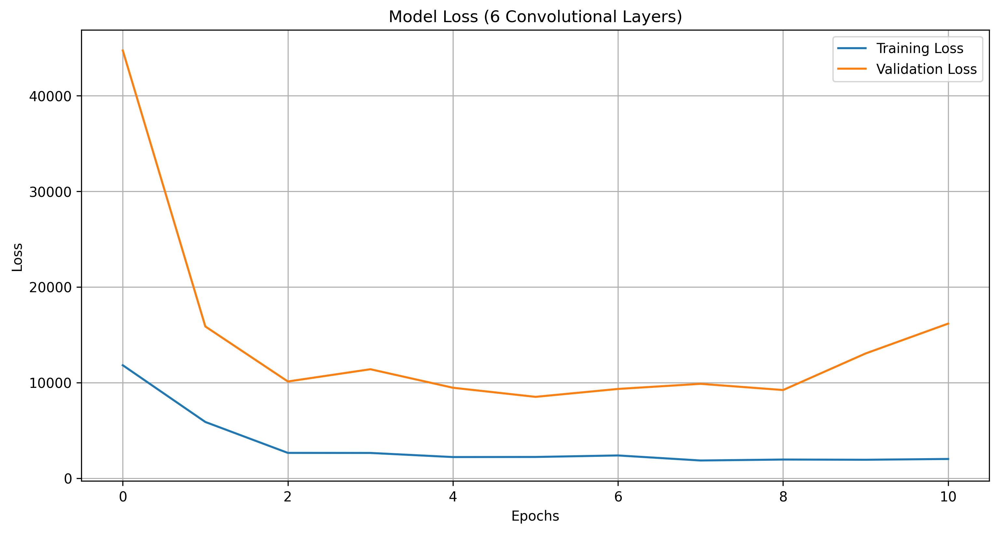

In [979]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_6_cnn.history['loss'], label='Training Loss')
plt.plot(history_6_cnn.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (6 Convolutional Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig("cnn_6.png", bbox_inches='tight')
plt.show()

In [980]:
train_accuracy = model_6_cnn.evaluate(X_train_cnn, y_train_cnn, verbose=0, return_dict=True)
test_accuracy = model_6_cnn.evaluate(X_test_cnn, y_test_cnn, verbose=0, return_dict=True)

print("6-Layer CNN (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

6-Layer CNN (Validation Metrics):
Mean Absolute Error (MAE): 46.2660
Mean Absolute Percentage Error (MAPE): 63.9592%
Mean Squared Error (MSE): 8503.4561
Root Mean Squared Error (RMSE): 92.2142
R2 Score: 0.8074


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


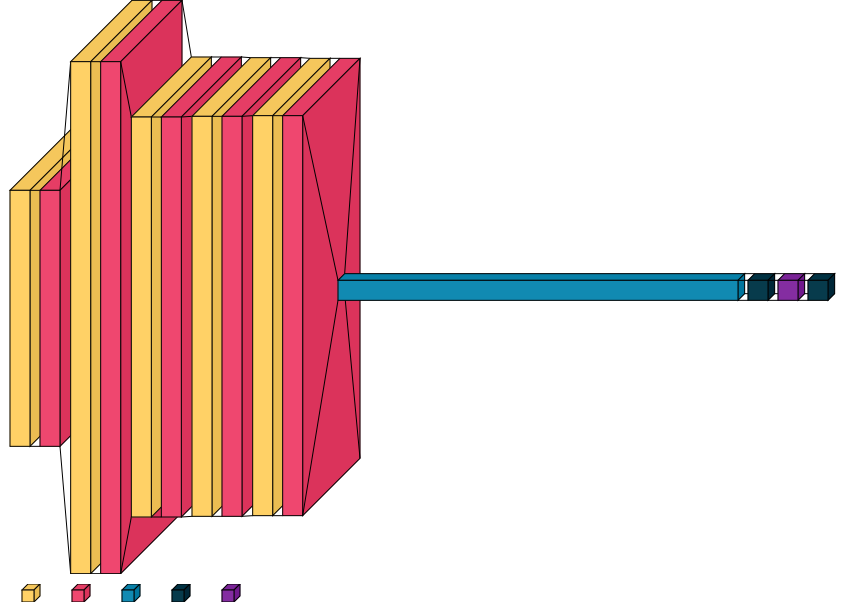

In [831]:
visualkeras.layered_view(model_6_cnn, legend=True)

### XGB-CNN

In [981]:
xgb_features = top_15_features.unique()

In [982]:
X_train_xgbcnn = X_train[xgb_features].copy()
X_test_xgbcnn = X_test[xgb_features].copy()
y_train_xgbcnn = y_train.to_numpy()
y_test_xgbcnn = y_test.to_numpy()

In [983]:
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_xgbcnn = scaler.fit_transform(X_train_xgbcnn)
X_test_xgbcnn  = scaler.transform(X_test_xgbcnn)

In [984]:
X_train_xgbcnn = np.array(X_train_xgbcnn).reshape((X_train_xgbcnn.shape[0], X_train_xgbcnn.shape[1], 1))
X_test_xgbcnn = np.array(X_test_xgbcnn).reshape((X_test_xgbcnn.shape[0], X_test_xgbcnn.shape[1], 1))

In [985]:
model_4_xgbcnn = Sequential()

# First convolutional layer
model_4_xgbcnn.add(Convolution1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_xgbcnn.shape[1], X_train_xgbcnn.shape[2])))
model_4_xgbcnn.add(MaxPooling1D(pool_size=1))

# Second convolutional layer
model_4_xgbcnn.add(Convolution1D(filters=128, kernel_size=2, activation='relu'))
model_4_xgbcnn.add(MaxPooling1D(pool_size=1))

# Third convolutional layer
model_4_xgbcnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_4_xgbcnn.add(MaxPooling1D(pool_size=1))

# Fourth convolutional layer
model_4_xgbcnn.add(Convolution1D(filters=100, kernel_size=2, activation='relu'))
model_4_xgbcnn.add(MaxPooling1D(pool_size=1))

# Flatten the output
model_4_xgbcnn.add(Flatten())

# Fully connected layer
model_4_xgbcnn.add(Dense(128, activation='relu'))
model_4_xgbcnn.add(Dropout(0.5))
model_4_xgbcnn.add(Dense(1))  # Assuming a regression task


# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


# Compile the model_4_xgbcnn
model_4_xgbcnn.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Fit the model_4_xgbcnn
history_4_xgbcnn = model_4_xgbcnn.fit(X_train_xgbcnn, y_train_xgbcnn, epochs=25, batch_size=32, validation_data=(X_test_xgbcnn, y_test_xgbcnn), callbacks=[early_stopping])

Epoch 1/25


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 15479.1426 - mean_absolute_error: 54.8366 - mean_absolute_percentage_error: 236.4079 - mean_squared_error: 11433.5898 - r2_score: 0.5918 - root_mean_squared_error: 106.8903 - val_loss: 47201.8945 - val_mean_absolute_error: 100.0434 - val_mean_absolute_percentage_error: 144.2254 - val_mean_squared_error: 47201.8945 - val_r2_score: -0.0690 - val_root_mean_squared_error: 217.2600
Epoch 2/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 11681.6494 - mean_absolute_error: 66.8885 - mean_absolute_percentage_error: 653.1951 - mean_squared_error: 11681.6494 - r2_score: 0.0170 - root_mean_squared_error: 108.0025 - val_loss: 45026.1250 - val_mean_absolute_error: 93.8927 - val_mean_absolute_percentage_error: 113.6108 - val_mean_squared_error: 45026.1250 - val_r2_score: -0.0197 - val_root_mean_squared_error: 212.1936
Epoch 3/25
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 10659.9473 - mean_absolute_error: 57.2290 - mean_absolute_percentage_error: 44

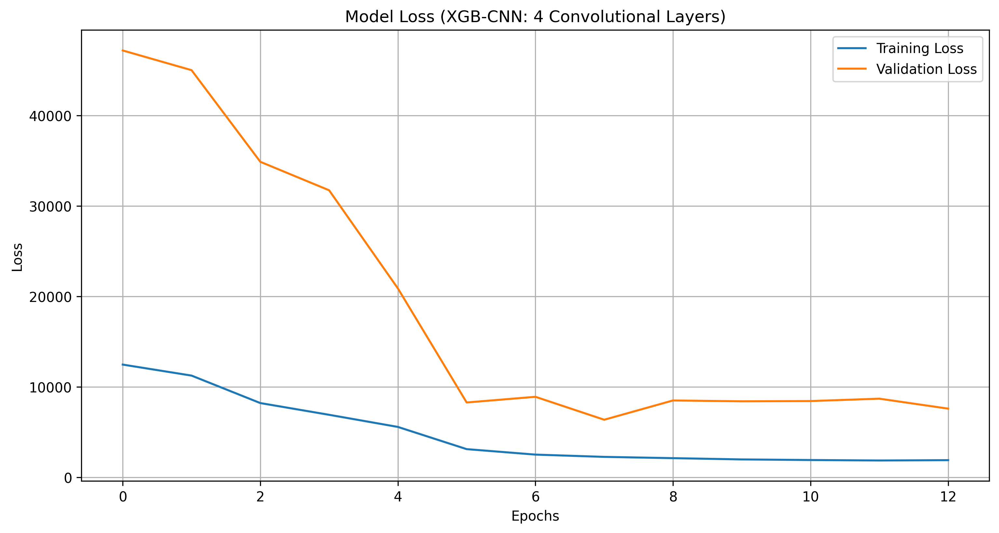

In [992]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_4_xgbcnn.history['loss'], label='Training Loss')
plt.plot(history_4_xgbcnn.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (XGB-CNN: 4 Convolutional Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig("xgbcnn_4.png", bbox_inches='tight')
plt.show()

In [987]:
train_accuracy = model_4_xgbcnn.evaluate(X_train_xgbcnn, y_train_xgbcnn, verbose=0, return_dict=True)
test_accuracy = model_4_xgbcnn.evaluate(X_test_xgbcnn, y_test_xgbcnn, verbose=0, return_dict=True)

print("XGB-CNN (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

XGB-CNN (Validation Metrics):
Mean Absolute Error (MAE): 43.3488
Mean Absolute Percentage Error (MAPE): 71.1909%
Mean Squared Error (MSE): 6381.9321
Root Mean Squared Error (RMSE): 79.8870
R2 Score: 0.8555


## LSTM

In [904]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM, GRU, BatchNormalization
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

In [907]:
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_lstm = scaler.fit_transform(X_train)
X_test_lstm  = scaler.transform(X_test)

In [908]:
# Ensure X_train, X_test are converted to NumPy arrays
# X_train_lstm = X_train_lstm.select_dtypes(include=[np.number]).to_numpy()
# X_test_lstm = X_test_lstm.select_dtypes(include=[np.number]).to_numpy()
# X_train_lstm = X_train.copy()
# X_test_lstm = X_test.copy()
y_train_lstm = y_train.copy()
y_test_lstm = y_test.copy()


In [890]:
train = pd.concat([X_train_lstm, y_train_lstm], axis=1)
test = pd.concat([X_test_lstm, y_test_lstm], axis=1)

In [891]:
train

,CAPEI,bm,evm,pe_op_basic,pe_op_dil,pe_exi,pe_inc,ps,pcf,dpr,...,us_inst_crash,us_ind_crash,us_inst_valuation,us_ind_valuation,year,month,day,sector_id,ticker_id,market_value
0,0.085657,0.225806,0.667616,0.556839,0.514828,0.755559,0.755559,0.075090,0.427457,0.0,...,0.593176,0.679691,0.515021,0.841206,2010,1,31,2,0,188.207205
1,0.085876,0.224694,0.664677,0.534326,0.490923,0.744892,0.744892,0.073405,0.424478,0.0,...,0.552231,0.688323,0.569206,0.773869,2010,2,28,2,0,180.266312
2,0.086199,0.224694,0.664677,0.534442,0.491047,0.744948,0.744948,0.085241,0.428637,0.0,...,0.718110,0.587460,0.543187,0.720603,2010,3,31,2,0,202.587658
3,0.086471,0.224694,0.664677,0.534542,0.491153,0.744995,0.744995,0.095215,0.432148,0.0,...,0.777428,0.685597,0.446888,0.688107,2010,4,30,2,0,228.018653
4,0.086115,0.221357,0.665417,0.534397,0.490999,0.744926,0.744926,0.085143,0.427779,0.0,...,0.812073,0.782372,0.410139,0.790285,2010,5,31,2,0,228.814101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3560,0.084771,0.194661,0.669386,0.556752,0.519232,0.757525,0.757525,0.141147,0.419570,0.0,...,0.437795,0.716493,0.050429,0.254606,2016,9,30,2,29,8.253648
3561,0.084841,0.194661,0.669386,0.558466,0.521385,0.758485,0.758485,0.151121,0.421109,0.0,...,0.303937,0.674239,0.132511,0.152429,2016,10,31,2,29,8.331161
3562,0.084722,0.194661,0.669102,0.555478,0.517701,0.756841,0.756841,0.138736,0.419195,0.0,...,0.177428,0.575193,0.122049,0.109883,2016,11,30,2,29,8.414920
3563,0.084675,0.194661,0.669102,0.554705,0.516727,0.756407,0.756407,0.131721,0.418116,0.0,...,0.240420,0.481145,0.000000,0.000000,2016,12,31,2,29,8.210005


In [892]:
# look_back = 5  # You can modify this

# # Split dataframe into X and y
# data = train.values  # Convert DataFrame to numpy array
# X_data_train = data[:, :-1]  # Features (first 47 columns)
# y_data_train = data[:, -1]   # Target (last column)

# data = test.values  # Convert DataFrame to numpy array
# X_data_test = data[:, :-1]  # Features (first 47 columns)
# y_data_test = data[:, -1]

# scaler = StandardScaler()
# X_data_train = scaler.fit_transform(X_data_train)
# X_data_test = scaler.transform(X_data_test)

# # Function to create the dataset with the look-back
# def create_lstm_dataset(X, y, look_back):
#     X_lstm, y_lstm = [], []
#     for i in range(len(X) - look_back):
#         X_lstm.append(X[i:(i + look_back)])  # Append past 'look_back' periods as input
#         y_lstm.append(y[i + look_back])      # Target at time step 'i + look_back'
#     return np.array(X_lstm), np.array(y_lstm)


# # Prepare LSTM input dataset
# trainX, trainY = create_lstm_dataset(X_data_train, y_data_train, look_back)
# testX, testY = create_lstm_dataset(X_data_test, y_data_test, look_back)

In [909]:
X_train_reshaped = np.array(X_train_lstm).reshape((X_train_lstm.shape[0], 1, X_train_lstm.shape[1]))
X_test_reshaped = np.array(X_test_lstm).reshape((X_test_lstm.shape[0], 1, X_test_lstm.shape[1]))

trainX = X_train_reshaped
trainY = y_train_lstm
testY = y_test_lstm
testX = X_test_reshaped


In [910]:
print("trainX Shape: ",trainX.shape) #[samples, time steps, features]
print("trainY Shape: ",trainY.shape)

print("testX Shape: ",testX.shape) #[samples, time steps, features]
print("testY Shape: ",testY.shape)

trainX Shape:  (2550, 1, 48)
trainY Shape:  (2550,)
testX Shape:  (1050, 1, 48)
testY Shape:  (1050,)


In [900]:
metrics = [tf.keras.metrics.MeanSquaredError(), tf.keras.metrics.RootMeanSquaredError(), tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.MeanAbsolutePercentageError(), tf.keras.metrics.R2Score()]

### 2 LSTM Layers

In [939]:
# ------------------LSTM-----------------------
model_2_lstm = Sequential()

# First LSTM layer with BatchNormalization
model_2_lstm.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
model_2_lstm.add(BatchNormalization())
model_2_lstm.add(Dropout(0.2))

# Second LSTM layer with BatchNormalization
model_2_lstm.add(LSTM(100, activation='tanh'))
model_2_lstm.add(BatchNormalization())
model_2_lstm.add(Dropout(0.2))

# Fully connected layer
model_2_lstm.add(Dense(50, activation='relu'))
model_2_lstm.add(Dropout(0.2))

# Output layer
model_2_lstm.add(Dense(units=1, activation='linear'))

# Compile model_2_lstm
model_2_lstm.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history_2_lstm = model_2_lstm.fit(trainX, trainY, epochs=30, batch_size=32, validation_data=(testX, testY), callbacks=[early_stopping])

# Evaluate model_2_lstm on test data
test_loss = model_2_lstm.evaluate(testX, testY)
print(f"Test Loss: {test_loss}")
model_2_lstm.summary()

Epoch 1/30


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 16556.9023 - mean_absolute_error: 52.6542 - mean_absolute_percentage_error: 92.4783 - mean_squared_error: 11759.1221 - r2_score: 0.5788 - root_mean_squared_error: 108.3482 - val_loss: 57680.1484 - val_mean_absolute_error: 117.1189 - val_mean_absolute_percentage_error: 93.1316 - val_mean_squared_error: 57680.1484 - val_r2_score: -0.3063 - val_root_mean_squared_error: 240.1669
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6944.3403 - mean_absolute_error: 40.6923 - mean_absolute_percentage_error: 101.2489 - mean_squared_error: 6944.3403 - r2_score: 0.3875 - root_mean_squared_error: 83.0043 - val_loss: 55742.3672 - val_mean_absolute_error: 113.3612 - val_mean_absolute_percentage_error: 84.5430 - val_mean_squared_error: 55742.3672 - val_r2_score: -0.2624 - val_root_mean_squared_error: 236.0982
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2427.5874 - mean_absolute_error: 26.1560 - mean_absolute_percentage_error: 97.6140 

Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_63 (LSTM)                  │ (None, 1, 100)         │        59,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_115 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_64 (LSTM)                  │ (None, 100)            │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 100)            │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_116 (Dropout)           │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_117 (Dropout)           │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 436,905 (1.67 MB)

 Trainable params: 145,501 (568.36 KB)

 Non-trainable params: 400 (1.56 KB)

 Optimizer params: 291,004 (1.11 MB)

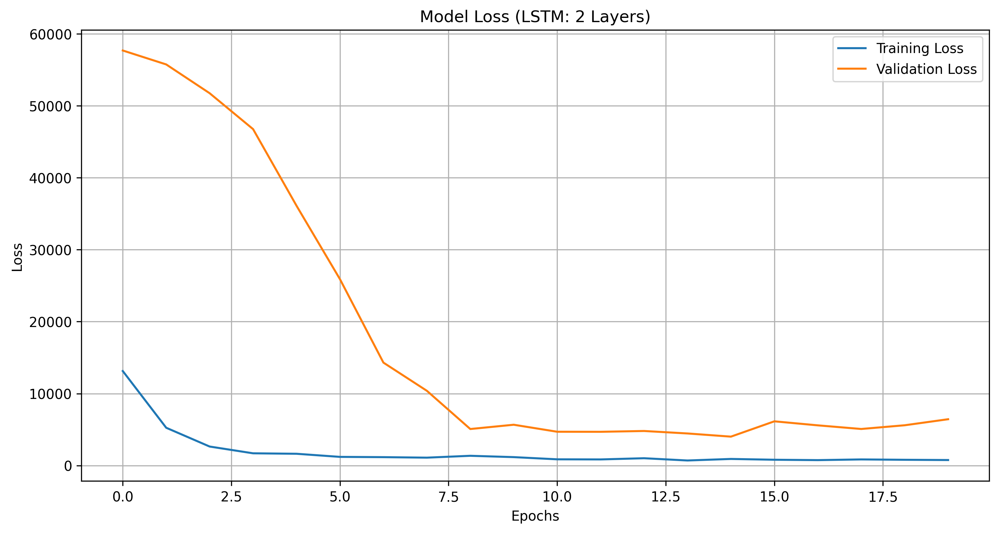

In [977]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_2_lstm.history['loss'], label='Training Loss')
plt.plot(history_2_lstm.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (LSTM: 2 Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig('lstm-2.png', bbox_inches='tight')
plt.show()

In [930]:
train_accuracy = model_2_lstm.evaluate(trainX, trainY, verbose=0, return_dict=True)
test_accuracy = model_2_lstm.evaluate(testX, testY, verbose=0, return_dict=True)

print("2-Layer LSTM (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

2-Layer LSTM (Validation Metrics):
Mean Absolute Error (MAE): 33.6921
Mean Absolute Percentage Error (MAPE): 56.1825%
Mean Squared Error (MSE): 3938.6113
Root Mean Squared Error (RMSE): 62.7584
R2 Score: 0.9108


### 4-Layer LSTM

In [932]:
# ------------------LSTM-----------------------
model_4_lstm = Sequential()


# First LSTM layer with BatchNormalization
model_4_lstm.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
model_4_lstm.add(BatchNormalization())
model_4_lstm.add(Dropout(0.2))

# Second LSTM layer with BatchNormalization
model_4_lstm.add(LSTM(100, activation='tanh', return_sequences=True))
model_4_lstm.add(BatchNormalization())
model_4_lstm.add(Dropout(0.2))

# Third LSTM layer
model_4_lstm.add(LSTM(100, activation='tanh', return_sequences=True))
model_4_lstm.add(BatchNormalization())
model_4_lstm.add(Dropout(0.2))

# Fourth LSTM layer (final LSTM layer without return_sequences)
model_4_lstm.add(LSTM(100, activation='tanh'))
model_4_lstm.add(BatchNormalization())
model_4_lstm.add(Dropout(0.2))

# Fully connected layer
model_4_lstm.add(Dense(50, activation='relu'))
model_4_lstm.add(Dropout(0.2))

# Output layer
model_4_lstm.add(Dense(units=1, activation='linear'))

# Compile model_4_lstm
model_4_lstm.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history_4_lstm = model_4_lstm.fit(trainX, trainY, epochs=30, batch_size=32, validation_data=(testX, testY), callbacks=[early_stopping])

# Evaluate model_4_lstm on test data
test_loss = model_4_lstm.evaluate(testX, testY)
print(f"Test Loss: {test_loss}")
model_4_lstm.summary()

Epoch 1/30


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 12349.1611 - mean_absolute_error: 43.3672 - mean_absolute_percentage_error: 82.3372 - mean_squared_error: 8162.0679 - r2_score: 0.6939 - root_mean_squared_error: 89.9033 - val_loss: 58100.5977 - val_mean_absolute_error: 118.1816 - val_mean_absolute_percentage_error: 95.9557 - val_mean_squared_error: 58100.5977 - val_r2_score: -0.3158 - val_root_mean_squared_error: 241.0406
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5454.3037 - mean_absolute_error: 34.5949 - mean_absolute_percentage_error: 92.8649 - mean_squared_error: 5454.3037 - r2_score: 0.5600 - root_mean_squared_error: 73.5063 - val_loss: 57565.3359 - val_mean_absolute_error: 116.8857 - val_mean_absolute_percentage_error: 92.5031 - val_mean_squared_error: 57565.3359 - val_r2_score: -0.3037 - val_root_mean_squared_error: 239.9278
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2828.5244 - mean_absolute_error: 27.8528 - mean_absolute_percentage_error: 125.5948 -

Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_59 (LSTM)                  │ (None, 1, 100)         │        59,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_110 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_60 (LSTM)                  │ (None, 1, 100)         │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_111 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_61 (LSTM)                  │ (None, 1, 100)         │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_112 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_62 (LSTM)                  │ (None, 100)            │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 100)            │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_113 (Dropout)           │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_114 (Dropout)           │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 920,905 (3.51 MB)

 Trainable params: 306,701 (1.17 MB)

 Non-trainable params: 800 (3.12 KB)

 Optimizer params: 613,404 (2.34 MB)

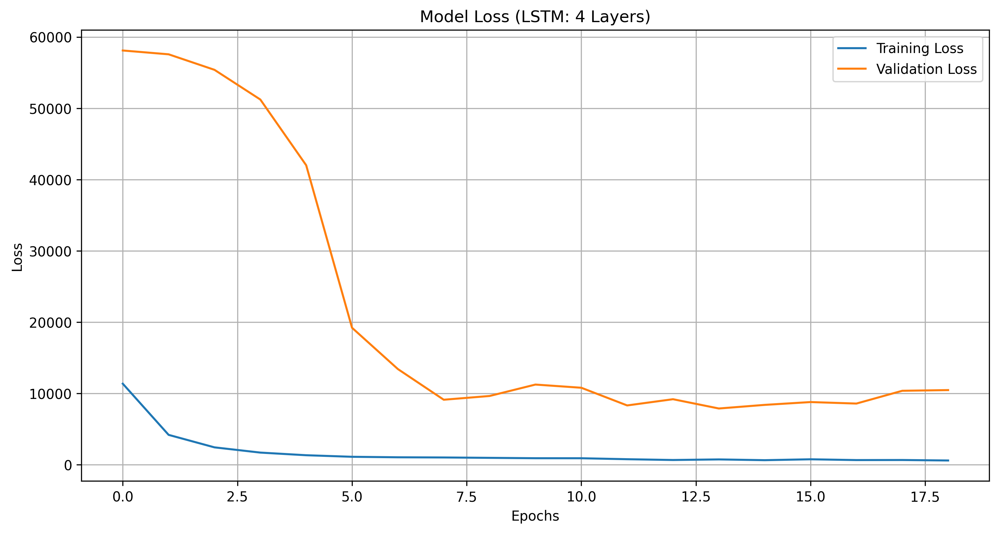

In [976]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_4_lstm.history['loss'], label='Training Loss')
plt.plot(history_4_lstm.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (LSTM: 4 Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig('lstm-4.png', bbox_inches='tight')
plt.show()

In [937]:
train_accuracy = model_4_lstm.evaluate(trainX, trainY, verbose=0, return_dict=True)
test_accuracy = model_4_lstm.evaluate(testX, testY, verbose=0, return_dict=True)

print("4-Layer LSTM (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

4-Layer LSTM (Validation Metrics):
Mean Absolute Error (MAE): 46.3696
Mean Absolute Percentage Error (MAPE): 62.2518%
Mean Squared Error (MSE): 7896.0981
Root Mean Squared Error (RMSE): 88.8600
R2 Score: 0.8212


### 6-Layer LSTM

In [988]:
# ------------------LSTM-----------------------
model_6_lstm = Sequential()


# First LSTM layer with BatchNormalization
model_6_lstm.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
model_6_lstm.add(BatchNormalization())
model_6_lstm.add(Dropout(0.2))

# Second LSTM layer with BatchNormalization
model_6_lstm.add(LSTM(100, activation='tanh', return_sequences=True))
model_6_lstm.add(BatchNormalization())
model_6_lstm.add(Dropout(0.2))

# Third LSTM layer
model_6_lstm.add(LSTM(100, activation='tanh', return_sequences=True))
model_6_lstm.add(BatchNormalization())
model_6_lstm.add(Dropout(0.2))

# Fourth LSTM layer
model_6_lstm.add(LSTM(100, activation='tanh', return_sequences=True))
model_6_lstm.add(BatchNormalization())
model_6_lstm.add(Dropout(0.2))

# Fifth LSTM layer
model_6_lstm.add(LSTM(100, activation='tanh', return_sequences=True))
model_6_lstm.add(BatchNormalization())
model_6_lstm.add(Dropout(0.2))

# Sixth LSTM layer (final LSTM layer without return_sequences)
model_6_lstm.add(LSTM(100, activation='tanh'))
model_6_lstm.add(BatchNormalization())
model_6_lstm.add(Dropout(0.2))

# Fully connected layer
model_6_lstm.add(Dense(50, activation='relu'))
model_6_lstm.add(Dropout(0.2))

# Output layer
model_6_lstm.add(Dense(units=1, activation='linear'))

# Compile model_6_lstm
model_6_lstm.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history_6_lstm = model_6_lstm.fit(trainX, trainY, epochs=30, batch_size=32, validation_data=(testX, testY), callbacks=[early_stopping])

# Evaluate model_6_lstm on test data
test_loss = model_6_lstm.evaluate(testX, testY)
print(f"Test Loss: {test_loss}")
model_6_lstm.summary()

/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - loss: 14484.3604 - mean_absolute_error: 49.8921 - mean_absolute_percentage_error: 93.1692 - mean_squared_error: 10416.3203 - r2_score: 0.6202 - root_mean_squared_error: 101.8408 - val_loss: 58114.1406 - val_mean_absolute_error: 118.1493 - val_mean_absolute_percentage_error: 95.7389 - val_mean_squared_error: 58114.1406 - val_r2_score: -0.3161 - val_root_mean_squared_error: 241.0687
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 6370.8677 - mean_absolute_error: 39.3306 - mean_absolute_percentage_error: 103.7742 - mean_squared_error: 6370.8677 - r2_score: 0.4205 - root_mean_squared_error: 79.6497 - val_loss: 57628.2656 - val_mean_absolute_error: 116.2866 - val_mean_absolute_percentage_error: 89.4196 - val_mean_squared_error: 57628.2656 - val_r2_score: -0.3051 - val_root_mean_squared_error: 240.0589
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4996.2710 - mean_absolute_error: 34.9758 - mean_absolute_percentage_er

Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_67 (LSTM)                  │ (None, 1, 100)         │        46,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_34          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_127 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_68 (LSTM)                  │ (None, 1, 100)         │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_35          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_128 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_69 (LSTM)                  │ (None, 1, 100)         │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_36          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_129 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_70 (LSTM)                  │ (None, 1, 100)         │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_37          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_130 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_71 (LSTM)                  │ (None, 1, 100)         │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_38          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_131 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_72 (LSTM)                  │ (None, 100)            │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_39          │ (None, 100)            │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_132 (Dropout)           │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_133 (Dropout)           │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,365,305 (5.21 MB)

 Trainable params: 454,701 (1.73 MB)

 Non-trainable params: 1,200 (4.69 KB)

 Optimizer params: 909,404 (3.47 MB)

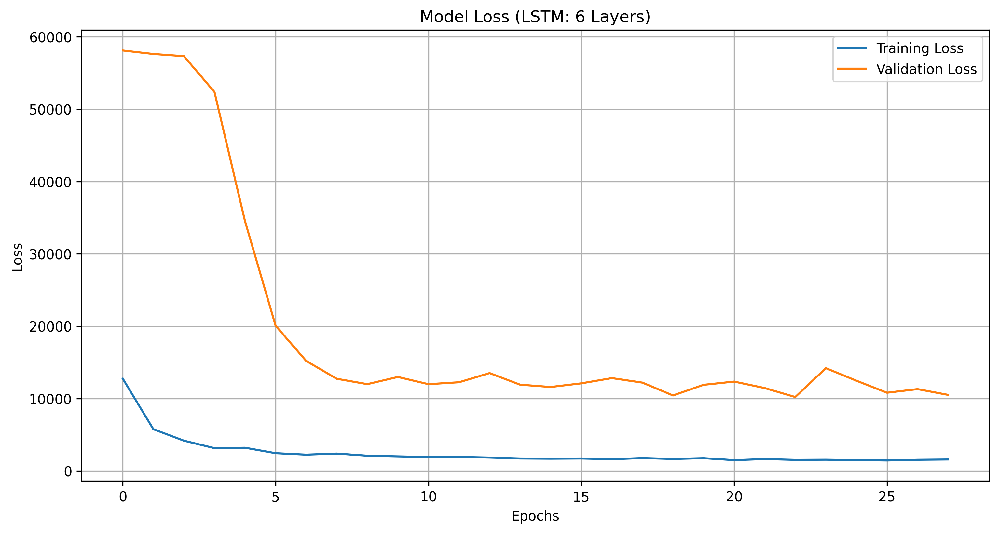

In [989]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_6_lstm.history['loss'], label='Training Loss')
plt.plot(history_6_lstm.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (LSTM: 6 Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig('lstm-6.png', bbox_inches='tight')
plt.show()

In [990]:
train_accuracy = model_6_lstm.evaluate(trainX, trainY, verbose=0, return_dict=True)
test_accuracy = model_6_lstm.evaluate(testX, testY, verbose=0, return_dict=True)

print("6-Layer LSTM (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

6-Layer LSTM (Validation Metrics):
Mean Absolute Error (MAE): 52.7580
Mean Absolute Percentage Error (MAPE): 53.2126%
Mean Squared Error (MSE): 10210.1992
Root Mean Squared Error (RMSE): 101.0455
R2 Score: 0.7688


### XGB-LSTM

In [965]:
xgb_features = top_15_features.unique()

In [966]:
scaler = MinMaxScaler(feature_range=(0, 1))
X_train_xgblstm = scaler.fit_transform(X_train[xgb_features])
X_test_xgblstm  = scaler.transform(X_test[xgb_features])

y_train_xgblstm = y_train.copy()
y_test_xgblstm = y_test.copy()

In [964]:
# might delete
X_train_xgbcnn = X_train[xgb_features].copy()
X_test_xgbcnn = X_test[xgb_features].copy()
y_train_xgbcnn = y_train.to_numpy() # might need to remove to numpy
y_test_xgbcnn = y_test.to_numpy()

In [967]:
X_train_reshaped_xgblstm = np.array(X_train_xgblstm).reshape((X_train_xgblstm.shape[0], 1, X_train_xgblstm.shape[1]))
X_test_reshaped_xgblstm = np.array(X_test_xgblstm).reshape((X_test_xgblstm.shape[0], 1, X_test_xgblstm.shape[1]))

trainX = X_train_reshaped_xgblstm
trainY = y_train_lstm
testY = y_test_lstm
testX = X_test_reshaped_xgblstm

In [968]:
# ------------------LSTM-----------------------
model_2_xgblstm = Sequential()

# First LSTM layer with BatchNormalization
model_2_xgblstm.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
model_2_xgblstm.add(BatchNormalization())
model_2_xgblstm.add(Dropout(0.2))

# Second LSTM layer with BatchNormalization
model_2_xgblstm.add(LSTM(100, activation='tanh'))
model_2_xgblstm.add(BatchNormalization())
model_2_xgblstm.add(Dropout(0.2))

# Fully connected layer
model_2_xgblstm.add(Dense(50, activation='relu'))
model_2_xgblstm.add(Dropout(0.2))

# Output layer
model_2_xgblstm.add(Dense(units=1, activation='linear'))

# Compile model_2_xgblstm
model_2_xgblstm.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=metrics)

# Early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history_2_xgblstm = model_2_xgblstm.fit(trainX, trainY, epochs=30, batch_size=32, validation_data=(testX, testY), callbacks=[early_stopping])

# Evaluate model_2_xgblstm on test data
test_loss = model_2_xgblstm.evaluate(testX, testY)
print(f"Test Loss: {test_loss}")
model_2_xgblstm.summary()

Epoch 1/30


/Users/pritish/Desktop/Thesis/env/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 13082.9014 - mean_absolute_error: 52.4294 - mean_absolute_percentage_error: 98.0195 - mean_squared_error: 10336.8096 - r2_score: 0.6163 - root_mean_squared_error: 101.5519 - val_loss: 57707.3555 - val_mean_absolute_error: 117.1884 - val_mean_absolute_percentage_error: 93.0353 - val_mean_squared_error: 57707.3555 - val_r2_score: -0.3069 - val_root_mean_squared_error: 240.2236
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6664.4619 - mean_absolute_error: 40.3445 - mean_absolute_percentage_error: 95.1738 - mean_squared_error: 6664.4619 - r2_score: 0.4431 - root_mean_squared_error: 81.4785 - val_loss: 54083.2578 - val_mean_absolute_error: 106.0802 - val_mean_absolute_percentage_error: 62.7799 - val_mean_squared_error: 54083.2578 - val_r2_score: -0.2248 - val_root_mean_squared_error: 232.5581
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3310.3530 - mean_absolute_error: 28.0583 - mean_absolute_percentage_error: 73.8838 -

Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_65 (LSTM)                  │ (None, 1, 100)         │        46,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 1, 100)         │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_122 (Dropout)           │ (None, 1, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_66 (LSTM)                  │ (None, 100)            │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 100)            │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_123 (Dropout)           │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_124 (Dropout)           │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 397,305 (1.52 MB)

 Trainable params: 132,301 (516.80 KB)

 Non-trainable params: 400 (1.56 KB)

 Optimizer params: 264,604 (1.01 MB)

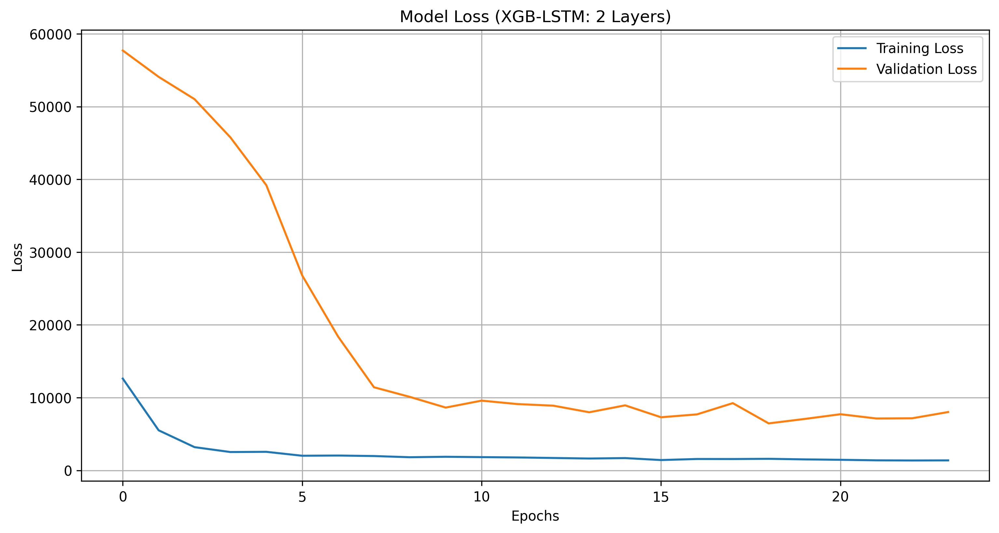

In [974]:
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(history_2_xgblstm.history['loss'], label='Training Loss')
plt.plot(history_2_xgblstm.history['val_loss'], label='Validation Loss')
plt.title('Model Loss (XGB-LSTM: 2 Layers)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.savefig('xgblstm-2.png', bbox_inches='tight')
plt.show()

In [975]:
train_accuracy = model_2_xgblstm.evaluate(trainX, trainY, verbose=0, return_dict=True)
test_accuracy = model_2_xgblstm.evaluate(testX, testY, verbose=0, return_dict=True)

print("2-Layer XGB-LSTM (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

2-Layer XGB-LSTM (Validation Metrics):
Mean Absolute Error (MAE): 44.9677
Mean Absolute Percentage Error (MAPE): 77.0480%
Mean Squared Error (MSE): 6459.7788
Root Mean Squared Error (RMSE): 80.3727
R2 Score: 0.8537


### Stacked LSTM

In [243]:
def create_stacked_lstm_model(units=50, activation='relu'):
    model = Sequential()
    model.add(LSTM(units, activation=activation, return_sequences=True, input_shape=(look_back, trainX.shape[2])))
    model.add(LSTM(units, activation=activation))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=metrics)
    return model

stacked_model = create_stacked_lstm_model(units=50, activation='relu')

# fit model
stacked_model.fit(trainX, trainY, epochs=200, verbose=0)

NameError: name 'look_back' is not defined

In [159]:
y_preds = stacked_model.predict(testX)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [160]:
print(testX.shape)
print(testY.shape)

(1410, 1, 47)
(1410,)


In [242]:
train_accuracy = model.evaluate(trainX, trainY, verbose=0, return_dict=True)
test_accuracy = model.evaluate(testX, testY, verbose=0, return_dict=True)

print("6-Layer CNN (Validation Metrics):")
mae = test_accuracy['mean_absolute_error']
print(f"Mean Absolute Error (MAE): {mae:.4f}")
mape = test_accuracy['mean_absolute_percentage_error']
print(f"Mean Absolute Percentage Error (MAPE): {mape:.4f}%")
mse = test_accuracy['mean_squared_error']
print(f"Mean Squared Error (MSE): {mse:.4f}", )
rmse = test_accuracy['root_mean_squared_error']
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
r2 = test_accuracy['r2_score']
print(f"R2 Score: {r2:.4f}")

AttributeError: 'Booster' object has no attribute 'evaluate'

### Evaluate Stacked

In [162]:
# Create a final dataframe to verify the predictions
df_pred = X_test_lstm.copy()
df_train = X_train_lstm.copy()
# Recreate a column for the complete date
date_columns = ["year", "month", "day"]
df_pred['date'] = pd.to_datetime(df_pred[date_columns])
df_train['date'] = pd.to_datetime(df_train[date_columns])
df_pred.drop(date_columns, inplace=True, axis=1)
df_train.drop(date_columns, inplace=True, axis=1)

In [169]:
stacked_model.predict(testX)

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step


array([[525.84344  ],
       [608.45087  ],
       [457.91132  ],
       ...,
       [ 32.17931  ],
       [ 13.3061285],
       [ 13.442267 ]], dtype=float32)

In [178]:
pd.Series(y_preds.flatten())
df_pred['col'] = pd.Series(y_preds.flatten())

In [182]:
df_pred[f"{y_col}_pred"] = pd.Series(y_preds.flatten())

df_pred = df_pred.merge(
    pd.Series(testY, name=y_col), 
    how = "inner", 
    left_index = True, 
    right_index = True
)
df_train = df_train.merge(
    pd.Series(trainY, name=y_col), 
    how = "inner", 
    left_index = True, 
    right_index = True
)

# As well as the ticker names
df_pred = df_pred.merge(
    tickers_df, 
    how = "inner",
    left_on = "ticker_id",
    right_on = "ticker_number"
)

df_train = df_train.merge(
    tickers_df, 
    how = "inner",
    left_on = "ticker_id",
    right_on = "ticker_number"
)

df_pred.drop(["ticker_id", "ticker_number"], inplace=True, axis=1)
df_train.drop(["ticker_id", "ticker_number"], inplace=True, axis=1)

In [183]:
df_pred["Squared Error"] = (df_pred[y_col] - df_pred[f"{y_col}_pred"]) ** 2
df_pred["Absolute Error"] = df_pred["Squared Error"].apply(np.abs)
df_pred["Absolute Percentage Error"] = (
    np.abs(df_pred[y_col] - df_pred[f"{y_col}_pred"]) / df_pred[y_col]
) * 100

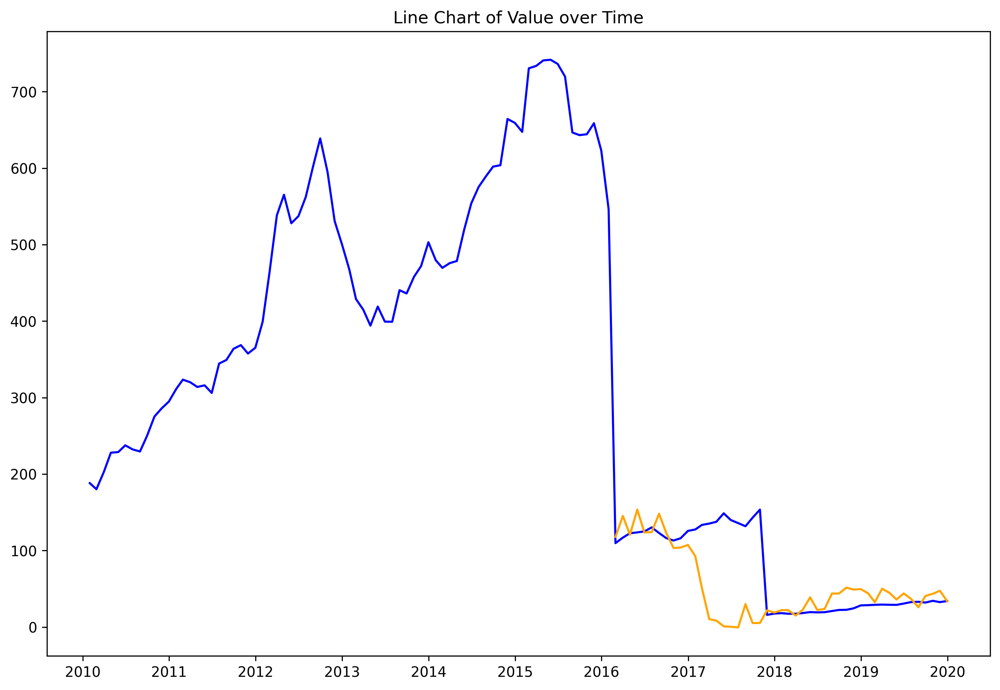

In [184]:
# Prepare data for visualisation
ticker = "AAPL"
df_train_viz = df_train[df_train['ticker'] == ticker]
df_pred_viz = df_pred[df_pred['ticker'] == ticker]

df_pred_viz = df_pred_viz.melt(
    id_vars=["ticker", "date"],
    value_vars=[f"{y_col}_pred", y_col],
    var_name="value_type",
    value_name="value"
)

df_train_viz = df_train_viz.melt(
    id_vars=["ticker", "date"],
    value_vars=[y_col],
    var_name="value_type",
    value_name="value"
)

df_combined = pd.concat([df_train_viz, df_pred_viz])
df_combined = df_combined.sort_values(by='date')


plt.figure(figsize=(12, 8), dpi=300)
# sns.lineplot(data=df_combined, x='date', y='value', hue='value_type')
plt.plot('date', 'value', data=df_combined[df_combined.value_type == y_col], color='blue')
plt.plot('date', 'value', data=df_combined[df_combined.value_type == f"{y_col}_pred"], color='orange')
plt.title('Line Chart of Value over Time')
plt.show()


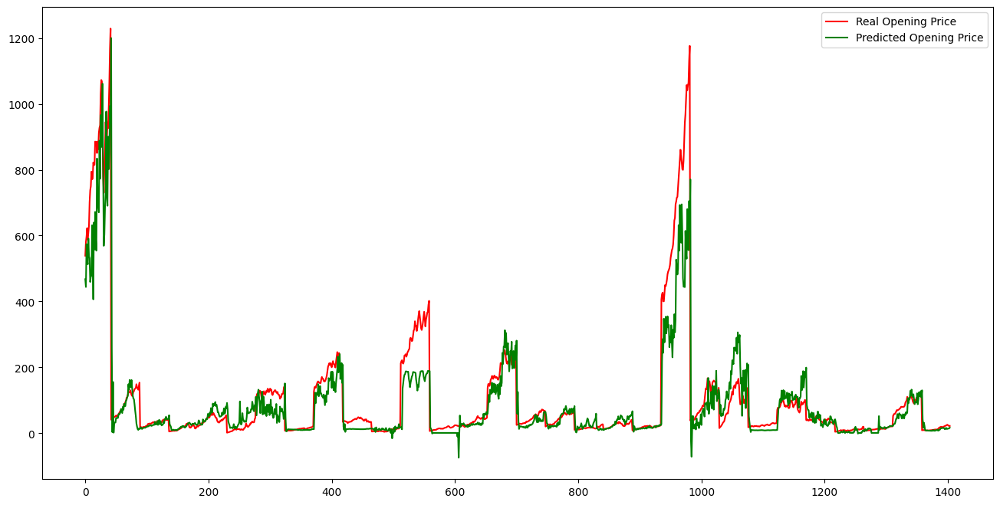

In [132]:
plt.figure(figsize=(16,8), dpi= 100, facecolor='w', edgecolor='k')

plt.plot(testY, color='red', label = 'Real Opening Price')
plt.plot(y_preds, color='green', label = 'Predicted Opening Price')
plt.legend(loc='best')

In [ ]:
# Inverse transform and reshape predictions
def inverse_transform_and_reshape(predictions, scaler, shape):
    predictions_copies = np.repeat(predictions, shape[2], axis=-1)
    return scaler.inverse_transform(np.reshape(predictions_copies, (len(predictions), shape[2])))[:, 0]

stacked_pred = inverse_transform_and_reshape(stacked_test_predictions, scaler, trainX.shape)

# Original test label
original_copies_array = np.repeat(testY, trainX.shape[2], axis=-1)
original_testY = scaler.inverse_transform(np.reshape(original_copies_array, (len(testY), trainX.shape[2])))[:, 0]

In [80]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)

history = model.fit(X_train_reshaped, y_train_lstm, validation_split=0.3, epochs=100, batch_size=64, callbacks=[es])

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 15067.6055 - root_mean_squared_error: 122.6013 - val_loss: 807.0900 - val_root_mean_squared_error: 28.4093
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14743.8867 - root_mean_squared_error: 121.1702 - val_loss: 766.2172 - val_root_mean_squared_error: 27.6806
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14836.8643 - root_mean_squared_error: 121.5968 - val_loss: 761.0347 - val_root_mean_squared_error: 27.5869
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16123.9033 - root_mean_squared_error: 126.9422 - val_loss: 731.0855 - val_root_mean_squared_error: 27.0386
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15171.1338 - root_mean_squared_error: 122.9814 - val_loss: 735.6702 - val_root_mean_squared_error: 27.1232
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16418.5527 - root_mean_squared_error: 128.0552 - val_loss: 711.5965 - val_root_mean_squared_error: 26.6758
Epoc

In [ ]:
history

In [255]:
history.history.keys()

dict_keys(['loss', 'mean_absolute_error', 'mean_absolute_percentage_error', 'mean_squared_error', 'r2_score', 'root_mean_squared_error', 'val_loss', 'val_mean_absolute_error', 'val_mean_absolute_percentage_error', 'val_mean_squared_error', 'val_r2_score', 'val_root_mean_squared_error'])

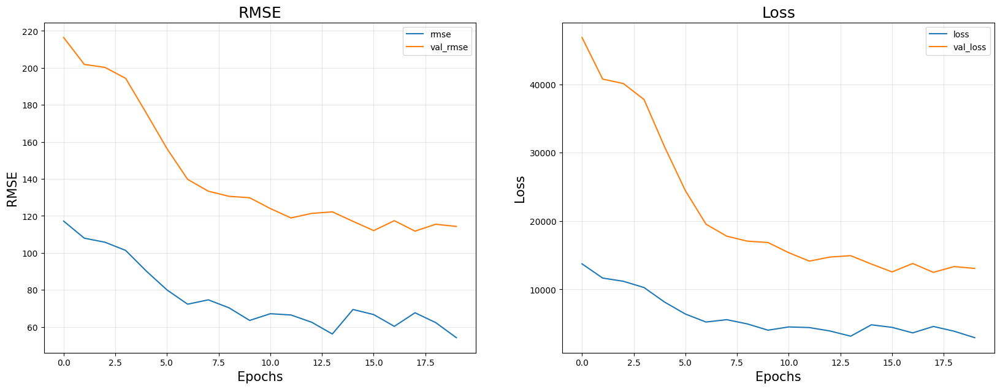

In [87]:
fig = plt.figure(figsize=(20,7))
fig.add_subplot(121)

# Accuracy
plt.plot(history.epoch, history.history['root_mean_squared_error'], label = "rmse")
plt.plot(history.epoch, history.history['val_root_mean_squared_error'], label = "val_rmse")

plt.title("RMSE", fontsize=18)
plt.xlabel("Epochs", fontsize=15)
plt.ylabel("RMSE", fontsize=15)
plt.grid(alpha=0.3)
plt.legend()


#Adding Subplot 1 (For Loss)
fig.add_subplot(122)

plt.plot(history.epoch, history.history['loss'], label="loss")
plt.plot(history.epoch, history.history['val_loss'], label="val_loss")

plt.title("Loss", fontsize=18)
plt.xlabel("Epochs", fontsize=15)
plt.ylabel("Loss", fontsize=15)
plt.grid(alpha=0.3)
plt.legend()

plt.show()